# ICA

In [55]:
subject_id = "101"

In [56]:
import mne
from mne.preprocessing import ICA
import autoreject
from pathlib import Path
import pandas as pd
from datetime import datetime
import json
import os

from spectral.ica import compute_ica
from spectral.viz import plot_step, plot_bad_channels, plot_epochs
from spectral.specparam import specparam2pandas
from spectral.utils import ProjectPaths,print_timestamp

""" config = read_parameters()
my_paths = config_project(subject)
project_path = my_paths["project_path"]
figures_path = my_paths["figures_path"]
specparam_path = my_paths["specparam_path"]

Path(specparam_path).mkdir(parents=True, exist_ok=True)
 """


paths = ProjectPaths(subject_id)
# Create all directories
paths.create_directories()

#paths = ProjectPaths(subject)
# Create all directories
#paths.create_directories()

# This is analysis output, so it goes in the analysis folder
specparam_path = paths.specparam
project_path = paths.root
figures_path = paths.figures
preprocessed_path = paths.preprocessed
epochs_path = paths.epochs
# Print paths to verify
print_timestamp("Setting up project paths")
paths.show()

mne.viz.set_browser_backend("matplotlib")
# mne.viz.set_browser_backend("qt")
mne.set_config("MNE_BROWSER_THEME", "light")
# matplotlib.use("Agg")
#print_date_time()

Created directories for sub-101
Project root: /Users/daniel/PhD/Projects/psd-paths
Setting up project paths: 2025-12-18 18:17:05
────────────────────────────────────────────────────────────
Paths for sub-101
Project Root: /Users/daniel/PhD/Projects/psd-paths
────────────────────────────────────────────────────────────
  analysis     : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis
  data         : /Users/daniel/PhD/Projects/psd-paths/data/bids/sub-101
  epochs       : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/epochs
  figures      : /Users/daniel/PhD/Projects/psd-paths/outputs/figures/sub-101
  ica          : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/ica
  logs         : /Users/daniel/PhD/Projects/psd-paths/data/logs
  outputs      : /Users/daniel/PhD/Projects/psd-paths/outputs
  preprocessed : /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/preprocessed
  processing   : /Users/daniel/PhD/Project

# Start raport

In [57]:
clean_raw = mne.io.read_raw_fif(
    f"{paths.preprocessed}/sub-{subject_id}_annotated_filtered_raw.fif", preload=True
)

total_duration = clean_raw.times[-1]
clean_raw = clean_raw.crop(tmin=3.0, tmax=total_duration - 3, include_tmax=True)

report = mne.Report(title=f"Report for subject {subject_id}", subject=subject_id)
report.add_raw(raw=clean_raw, title="Raw", psd=True, butterfly=True, scalings='auto')

# --- HANDLES CASE WITH NO BAD CHANNELS ---
if clean_raw.info["bads"]:
    print(f"Plotting {len(clean_raw.info['bads'])} bad channels for the report.")
    
    # We use a try-except here because plotting bads can occasionally 
    # throw a ValueError if channels were marked bad but then dropped.
    try:
        bad_channel_plot = clean_raw.plot(
            picks=clean_raw.info["bads"],
            duration=min(300.0, total_duration - 6), # Ensure duration isn't longer than file
            scalings=dict(eeg=1e-4),
            show_scrollbars=False,
            show=False # Prevent popup in headless environments
        )
        report.add_figure(bad_channel_plot, title="Rejected bad channels")
    except Exception as e:
        print(f"Could not plot bad channels: {e}")
else:
    print("No bad channels detected. Skipping bad channel plot.")
    # Optional: Add a text note to the report instead of a plot
    report.add_html(
        html="<p><b>Note:</b> No bad channels were detected or marked for this subject.</p>",
        title="Rejected bad channels"
    )

Opening raw data file /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/preprocessed/sub-101_annotated_filtered_raw.fif...
    Range : 0 ... 75099 =      0.000 ...   300.396 secs
Ready.
Reading 0 ... 75099  =      0.000 ...   300.396 secs...
Embedding : jquery-3.6.0.min.js
Embedding : bootstrap.bundle.min.js
Embedding : bootstrap.min.css
Embedding : bootstrap-table/bootstrap-table.min.js
Embedding : bootstrap-table/bootstrap-table.min.css
Embedding : bootstrap-table/bootstrap-table-copy-rows.min.js
Embedding : bootstrap-table/bootstrap-table-export.min.js
Embedding : bootstrap-table/tableExport.min.js
Embedding : bootstrap-icons/bootstrap-icons.mne.min.css
Embedding : highlightjs/highlight.min.js
Embedding : highlightjs/atom-one-dark-reasonable.min.css
Setting 3850 of 73600 (5.23%) samples to NaN, retaining 69750 (94.77%) samples.
Effective window size : 8.192 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the res

/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_24546/779053518.py:9: RuntimeWarning: Omitted 2 annotation(s) that were outside data range.
  report.add_raw(raw=clean_raw, title="Raw", psd=True, butterfly=True, scalings='auto')
/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_24546/779053518.py:9: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  report.add_raw(raw=clean_raw, title="Raw", psd=True, butterfly=True, scalings='auto')
/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/mne/time_frequency/psd.py:291: UserWarning: nperseg = 2048 is greater than input length  = 375, using nperseg = 375
  return _func(*args, **kwargs)


Plotting 7 bad channels for the report.


# ICA

ICA should be applied before the spatial interpolation of the
non-functional channels.

In [58]:
epochs_good = mne.read_epochs(
    f"{paths.epochs}/sub-{subject_id}_good_epochs-epo.fif"
)

Reading /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/epochs/sub-101_good_epochs-epo.fif ...
    Found the data of interest:
        t =       0.00 ...    5000.00 ms
        0 CTF compensation matrices available
Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


In [59]:
import mne
import numpy as np
from mne.preprocessing import ICA

# GLOBAL SETTING: Keep this as 'warn' so the rest of the pipeline 
# doesn't crash on minor floating point issues.
np.seterr(all='warn')

def compute_ica_limited(eeg_data, variance_threshold=0.99, max_cap=40, random_state=97):
    """
    Computes ICA with 99% variance, capped at max_cap.
    Safely handles Picard failure and falls back to Infomax.
    """
    # 1. Calculate the rank integer
    ranks = mne.compute_rank(eeg_data)
    actual_rank = ranks['eeg'] if 'eeg' in ranks else sum(ranks.values())
    print(f"Data rank detected: {actual_rank}")
    
    # 2. Estimate components for variance threshold using FastICA
    # Wrapped in errstate to prevent notebook-level crashes during estimation
    print(f"Estimating component count for {variance_threshold*100}% variance...")
    with np.errstate(all='ignore'):
        tmp_ica = ICA(
            n_components=variance_threshold, 
            method='fastica', 
            random_state=random_state
        )
        tmp_ica.fit(eeg_data) 
        n_variance = tmp_ica.n_components_
    
    # 3. Apply the cap
    n_final = min(n_variance, max_cap, actual_rank - 1)
    print(f"Variance threshold requested {n_variance} components.")
    print(f"Applying cap: Final ICA will use {n_final} components.")

    # 4. Attempt Picard
    try:
        print(f"Attempting Picard...")
        ica = ICA(
            n_components=n_final,
            method='picard',
            random_state=random_state,
            fit_params=dict(ortho=False, extended=True),
            max_iter=500
        )
        
        # LOCAL OVERRIDE: We raise errors ONLY here to trigger the 'except' block
        # if Picard hits a numerical stability issue.
        with np.errstate(all='raise'):
            ica.fit(eeg_data)
        print("Success: Picard converged.")

    # 5. Fallback to Infomax
    except (FloatingPointError, RuntimeWarning, ValueError, Exception) as e:
        print(f"Picard failed ({type(e).__name__}: {e}). Falling back to Infomax...")
        ica = ICA(
            n_components=n_final,
            method='infomax',
            random_state=random_state,
            fit_params=dict(extended=True),
            max_iter='auto'
        )
        # We go back to 'ignore' or 'warn' for the fallback to ensure it finishes
        with np.errstate(all='warn'):
            ica.fit(eeg_data)
        print("Success: Infomax converged.")
        
    return ica

In [60]:

ica = compute_ica_limited(epochs_good, variance_threshold=0.99, max_cap=50, random_state=97)
print(ica.n_components_)
ica.save(
    f"{paths.analysis}/sub-{subject_id}_my_ica_model-ica.fif", overwrite=True)


Computing rank from data with rank=None
    Using tolerance 7.4e-11 (2.2e-16 eps * 197 dim * 1.7e+03  max singular value)
    Estimated rank (eeg): 197
    EEG: rank 197 computed from 197 data channels with 0 projectors
Data rank detected: 197
Estimating component count for 99.0% variance...
Fitting ICA to data using 197 channels (please be patient, this may take a while)
Selecting by explained variance: 21 components
Fitting ICA took 0.7s.
Variance threshold requested 21 components.
Applying cap: Final ICA will use 21 components.
Attempting Picard...
Fitting ICA to data using 197 channels (please be patient, this may take a while)
Selecting by number: 21 components
Picard failed (FloatingPointError: underflow encountered in exp). Falling back to Infomax...
Fitting ICA to data using 197 channels (please be patient, this may take a while)
Selecting by number: 21 components
Computing Extended Infomax ICA
Fitting ICA took 6.5s.
Success: Infomax converged.
21
Overwriting existing file.
Wri

Method,infomax
Fit parameters,extended=Truemax_iter=500
Fit,500 iterations on epochs (97578 samples)
ICA components,21
Available PCA components,197
Channel types,eeg
ICA components marked for exclusion,—


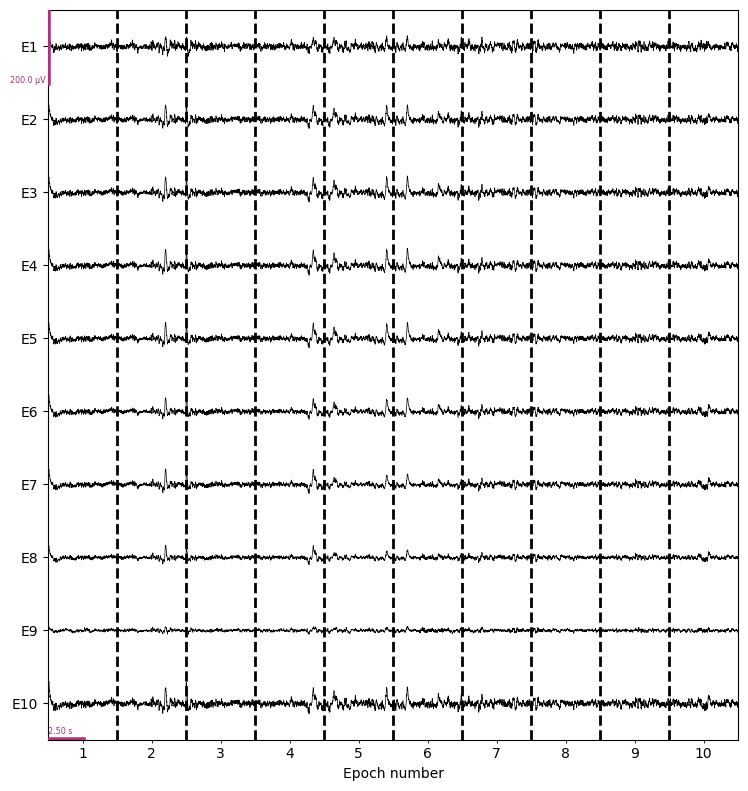

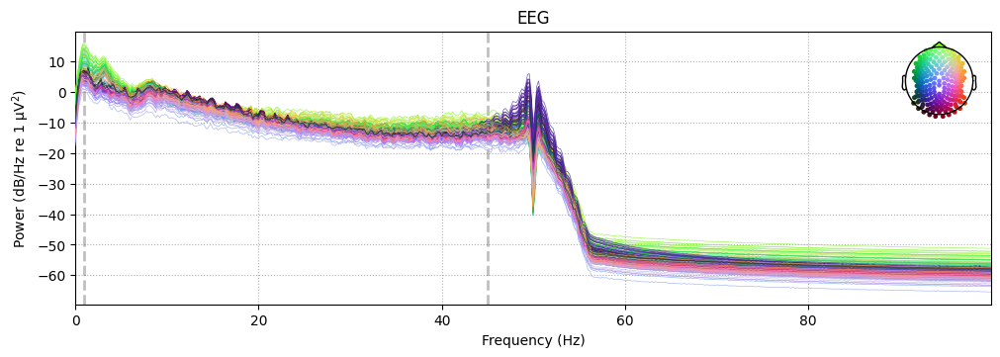

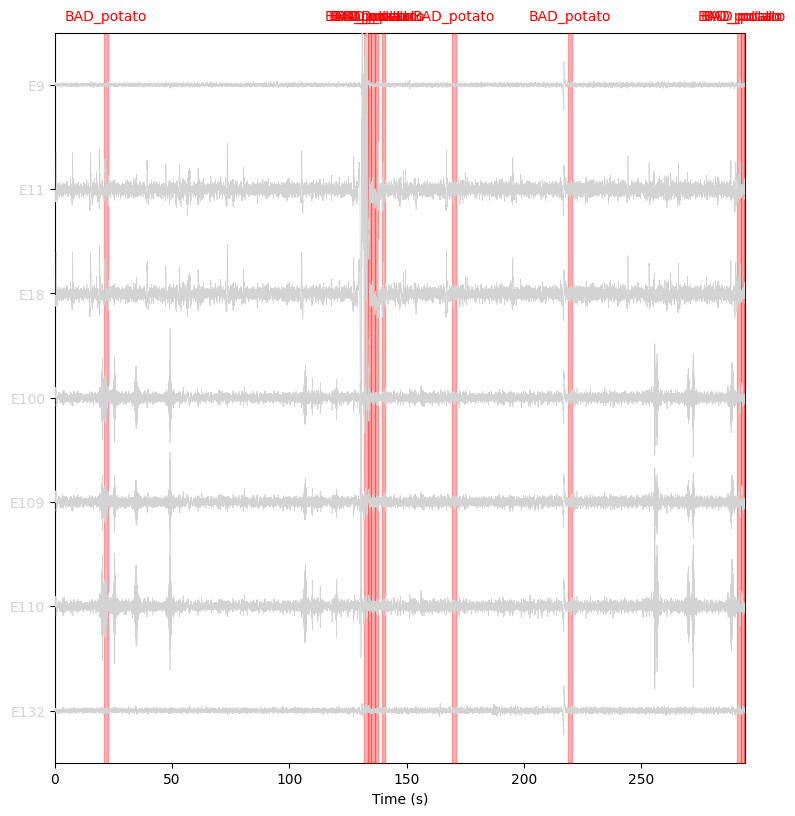

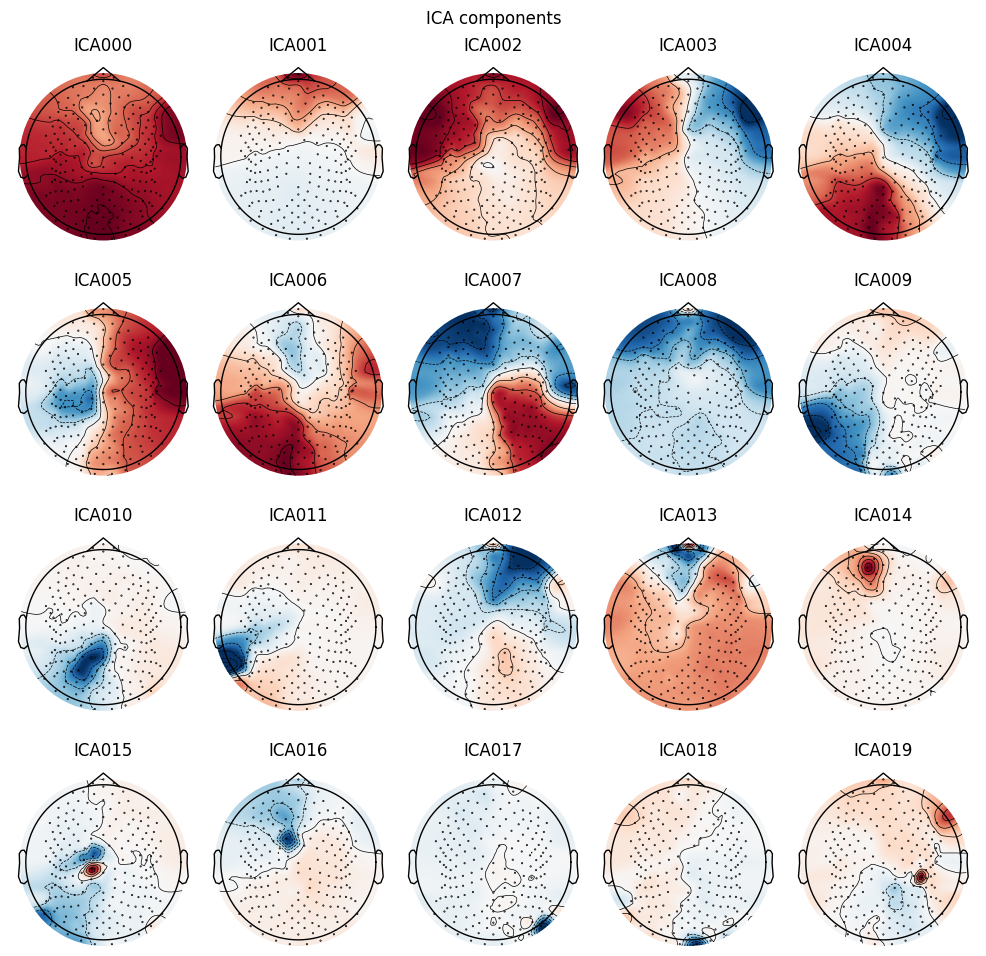

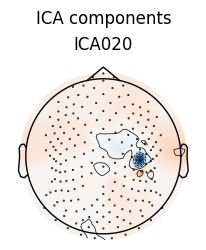

In [61]:
ica_plot_components = ica.plot_components()

Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


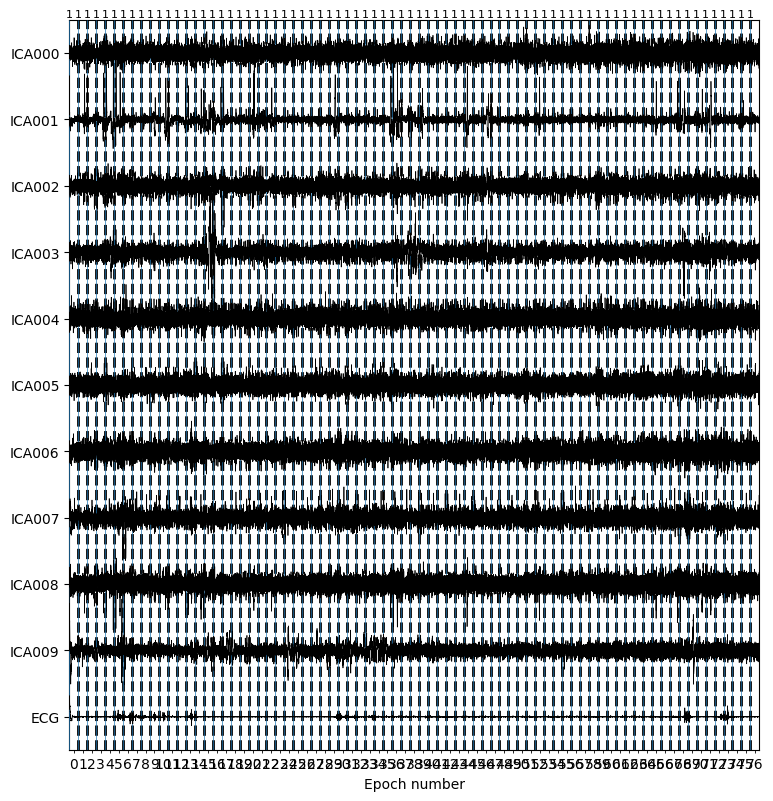

Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


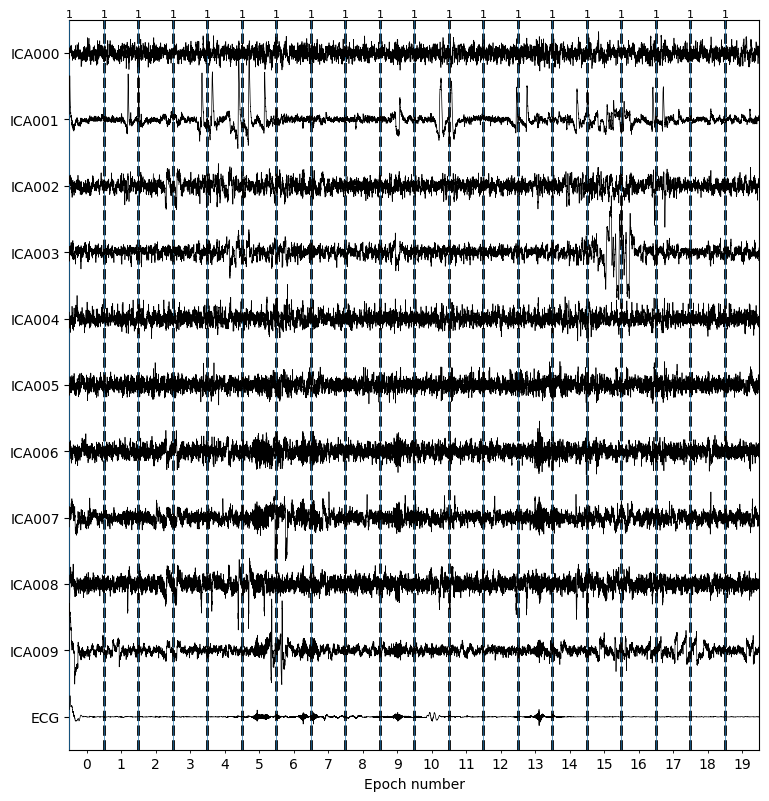

Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


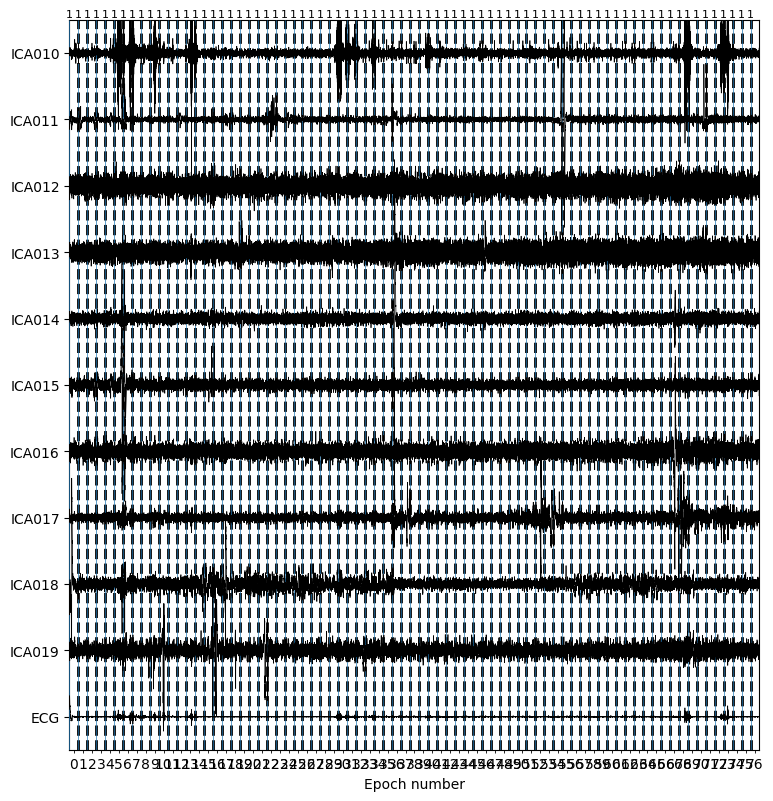

Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


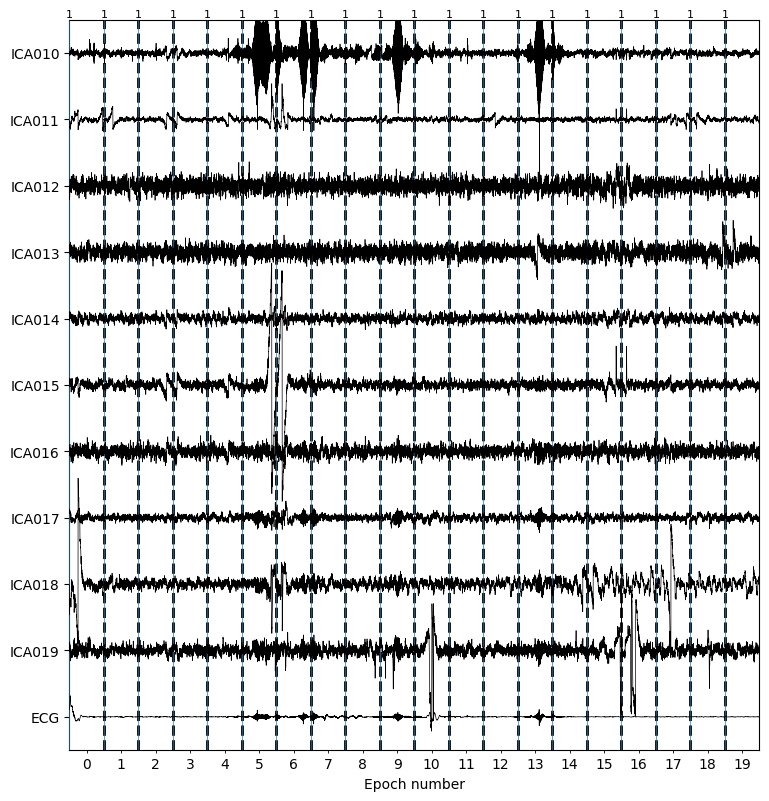

Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


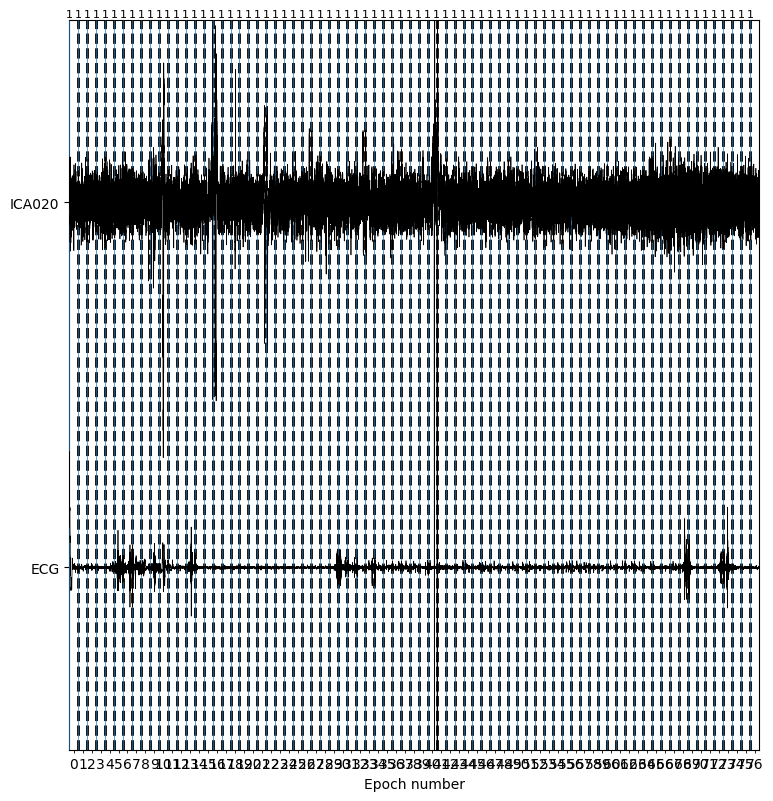

Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


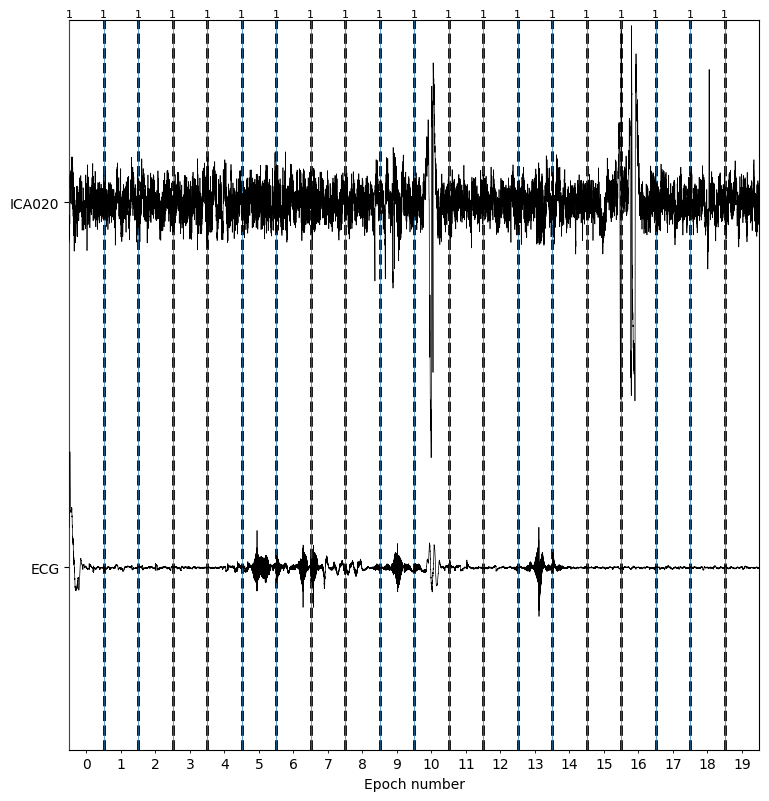

In [62]:
chunk_size = 10
chunks = [
    range(i, min(i + chunk_size, ica.n_components_))
    for i in range(0, ica.n_components_, chunk_size)
]

for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=0,
        stop=len(epochs_good) - 1,
    )
    # for chunk in chunks:
    ica_plot = ica.plot_sources(
        epochs_good,
        picks=chunk,
        show_scrollbars=False,
        start=0,
        stop=20,
    )

In [63]:
explained_var_ratio = ica.get_explained_variance_ratio(epochs_good)
for channel_type, ratio in explained_var_ratio.items():
    print(
        f"Fraction of {
            channel_type} variance explained by all components: "
        f"{ratio}"
    )

Fraction of eeg variance explained by all components: 0.9903527537912203


# ICA label gui

In [64]:
from mne_icalabel.gui import label_ica_components

# gui = label_ica_components(epochs_good, ica)

# Removing components

In [65]:
ecg_indices, ecg_scores = ica.find_bads_ecg(
    clean_raw, method="correlation", threshold="auto"
)

try:
    # ica_plot = ica.plot_sources(eeg_data)
    # Exclude blink artifact components (use Fp1 as EOG proxy)

    # ica.exclude = np.argwhere(abs(eog_scores) > 0.5).ravel().tolist()
    _ = ica.plot_sources(
        epochs_good,
        show_scrollbars=False,
        picks=ecg_indices,
        start=0,
        stop=300.0,
    )
    _ = ica.plot_properties(epochs_good, picks=ecg_indices)
except Exception as e:
    # If an exception occurs, print the error message
    print("An error occurred:", e)

Omitting 3850 of 73600 (5.23%) samples, retaining 69750 (94.77%) samples.
Omitting 3850 of 73600 (5.23%) samples, retaining 69750 (94.77%) samples.
... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff fre

In [66]:
from mne_icalabel import label_components
def plot_ica_by_label(ica, eeg_data, ic_labels, report=None):
    """
    Plots ICA components grouped by their ICLabel classification.
    Correctly handles cases where plot_components returns a list of figures.
    """
    labels = ic_labels["labels"]
    probs = ic_labels["y_pred_proba"]
    
    titles = {
        i: f"IC{i}: {label} ({probs[i]*100:.1f}%)" 
        for i, label in enumerate(labels)
    }

    # 1. Generate the Topographies
    # We set show=False to prevent duplicate plots in notebooks
    figs = ica.plot_components(inst=eeg_data, title="ICA Components by Label", show=False)
    
    # Ensure figs is always a list for consistent iteration
    if not isinstance(figs, list):
        figs = [figs]

    ic_idx = 0
    for fig in figs:
        # Update titles of the individual axes
        for ax in fig.axes:
            if ic_idx < len(labels):
                ax.set_title(titles[ic_idx], fontsize=8)
                ic_idx += 1
        
        # Display the figure in the notebook
        display(fig)
        
        if report is not None:
            report.add_figure(fig, title=f"ICA Component Topographies (Page {figs.index(fig)+1})")

    # 2. Plot properties for artifact components (Eye, Muscle, etc.)
    artifacts = ["eye blink", "muscle artifact", "heart beat", "line noise", "channel noise"]
    bad_indices = [i for i, l in enumerate(labels) if l in artifacts]
    
    if bad_indices:
        print(f"Found {len(bad_indices)} artifact components. Generating property plots...")
        # plot_properties always returns a list
        fig_props = ica.plot_properties(eeg_data, picks=bad_indices, show=False)
        
        for idx, fig in zip(bad_indices, fig_props):
            display(fig) # Show in notebook
            if report is not None:
                report.add_figure(fig, title=f"Properties IC {idx}: {titles[idx]}")

    return figs

Classifying ICA components...


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_24546/1227788655.py:8: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(clean_raw, ica, method="iclabel")
/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_24546/1227788655.py:8: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(clean_raw, ica, method="iclabel")


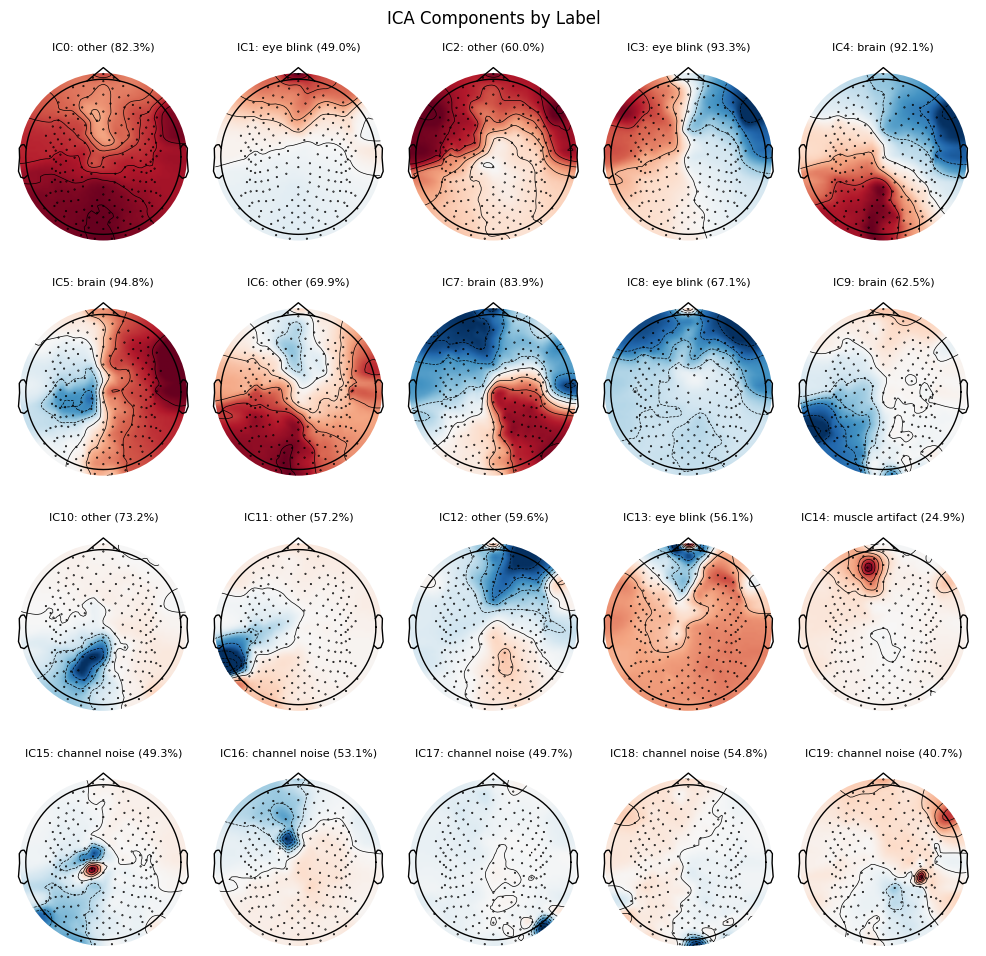

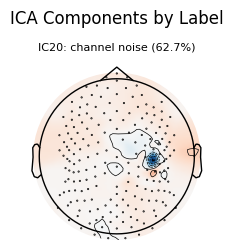

Found 11 artifact components. Generating property plots...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134

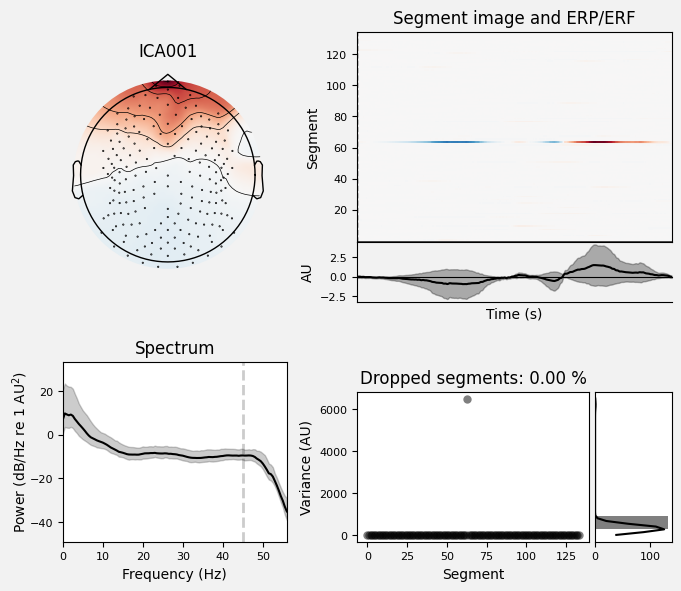

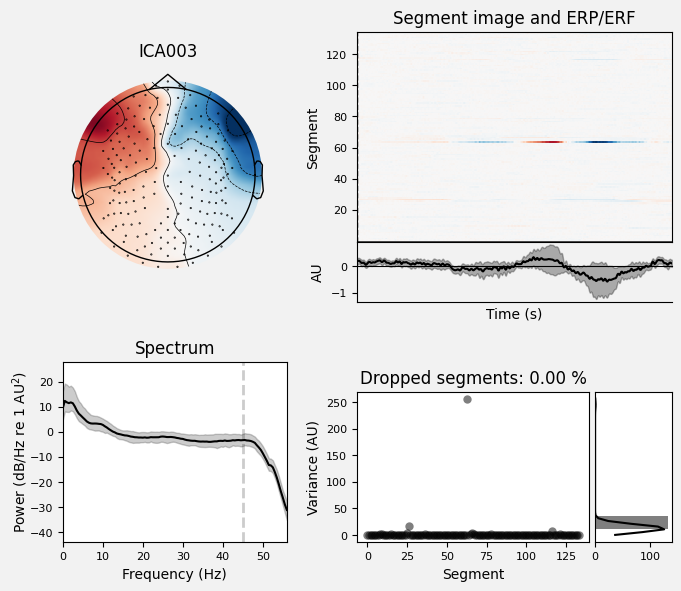

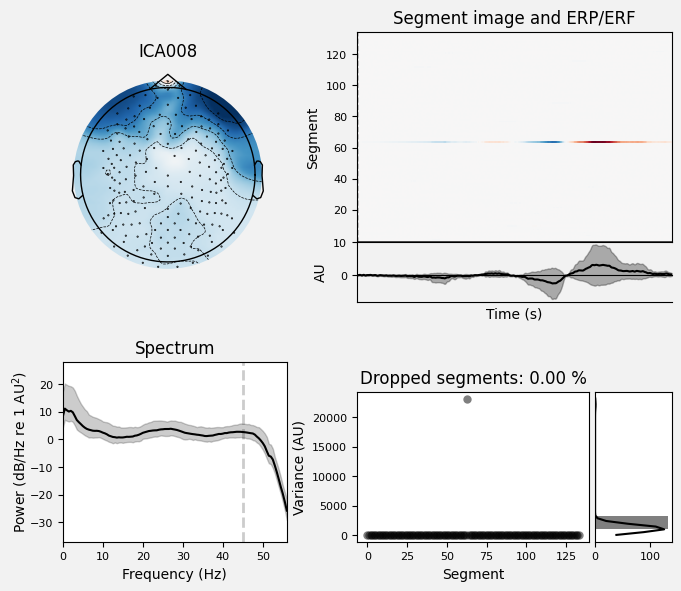

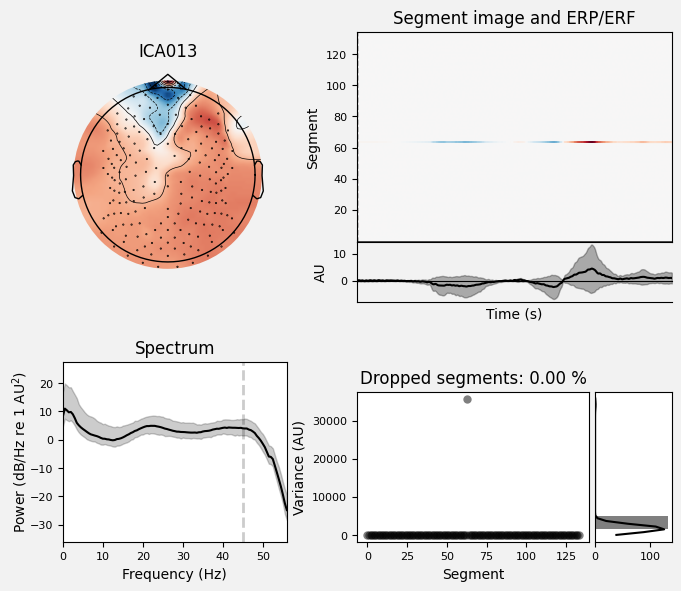

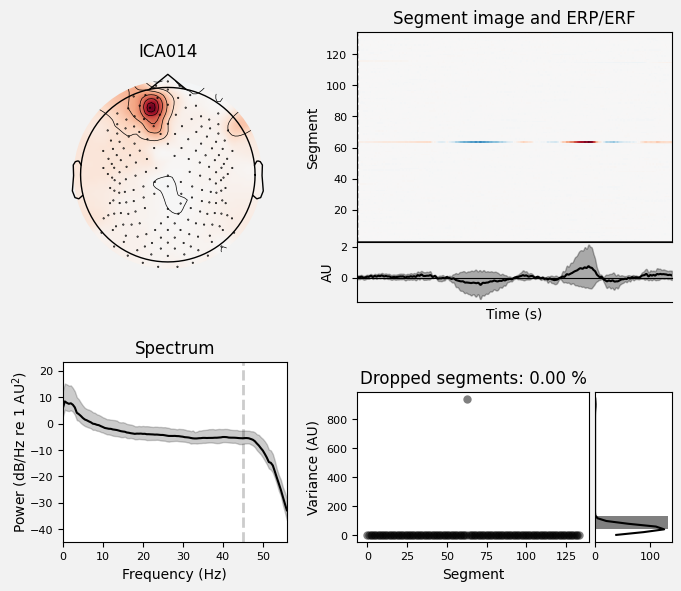

...

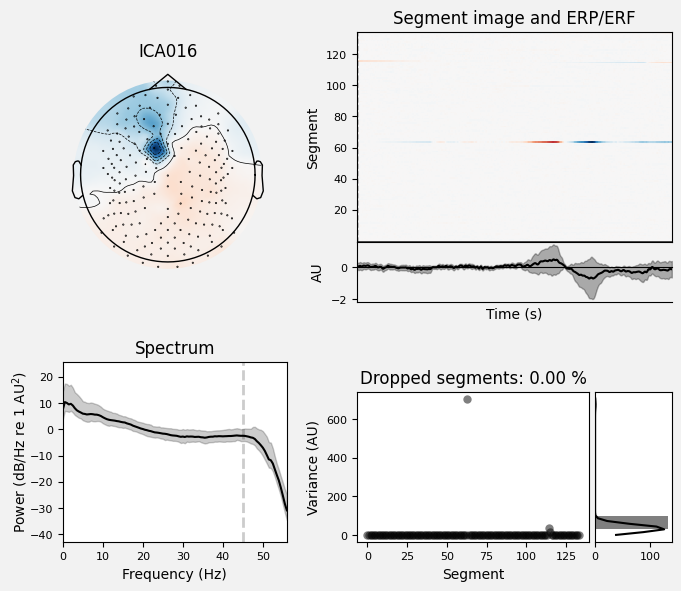

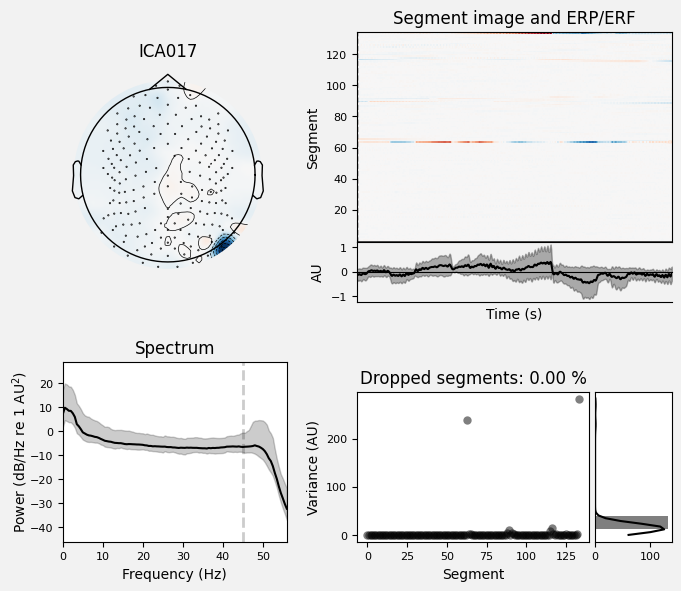

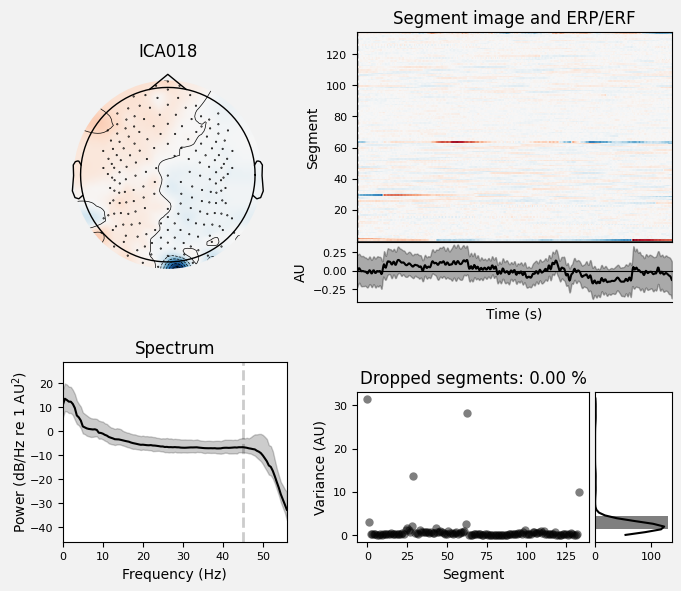

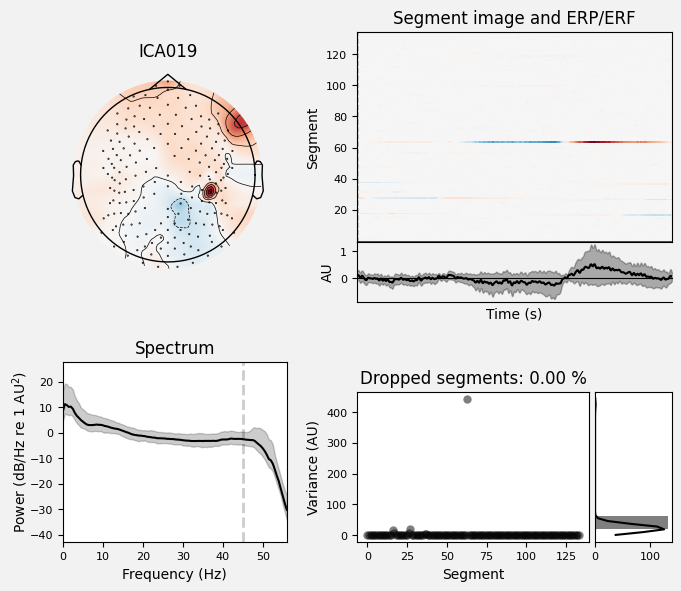

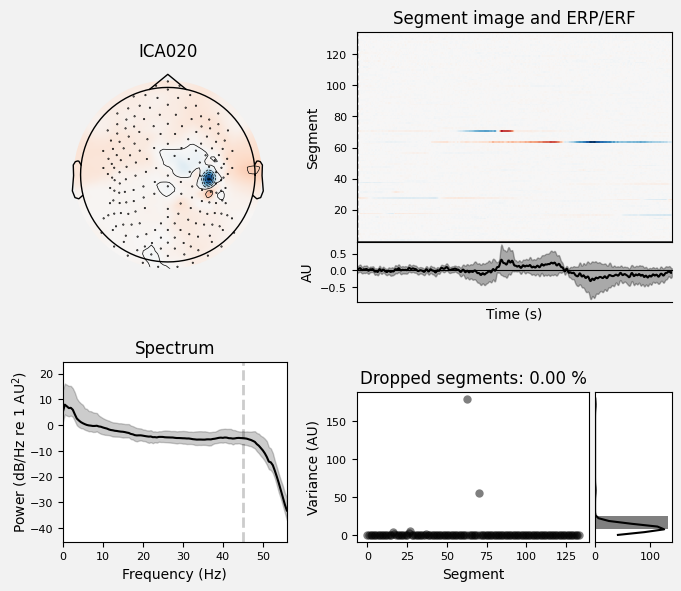

ICA components excluded: [1, 3, 8, 13, 14, 15, 16, 17, 18, 19, 20]
Components marked for exclusion (>90% confidence): [3]


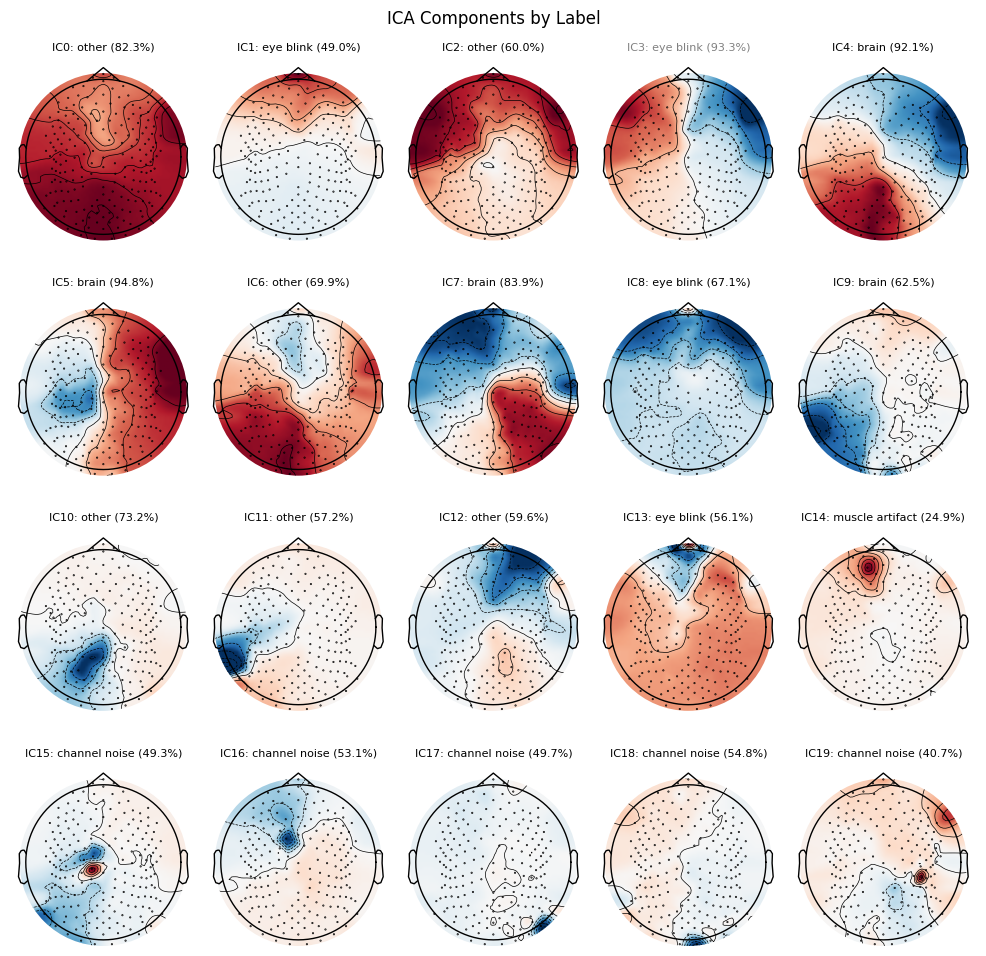

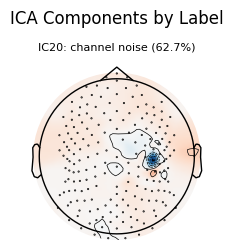

Found 11 artifact components. Generating property plots...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated


/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/mne/viz/ica.py:188: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize, facecolor=[0.95] * 3)


Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
134 matching events found
No baseline correction applied
0 projection items activated


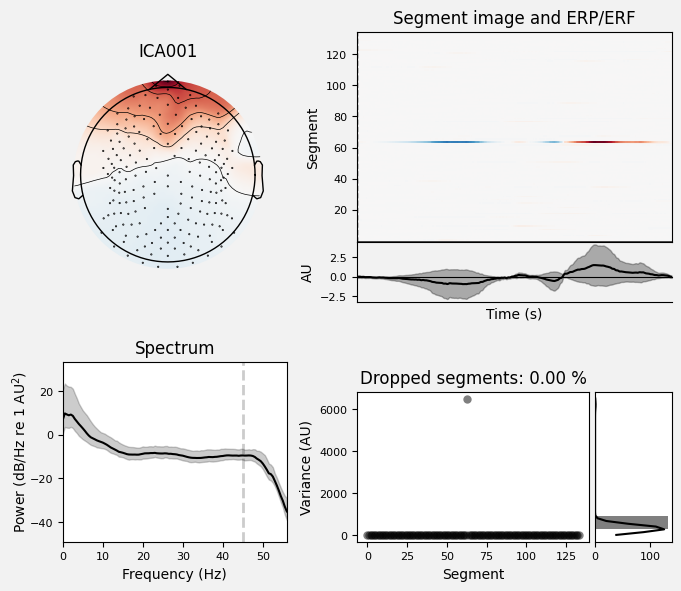

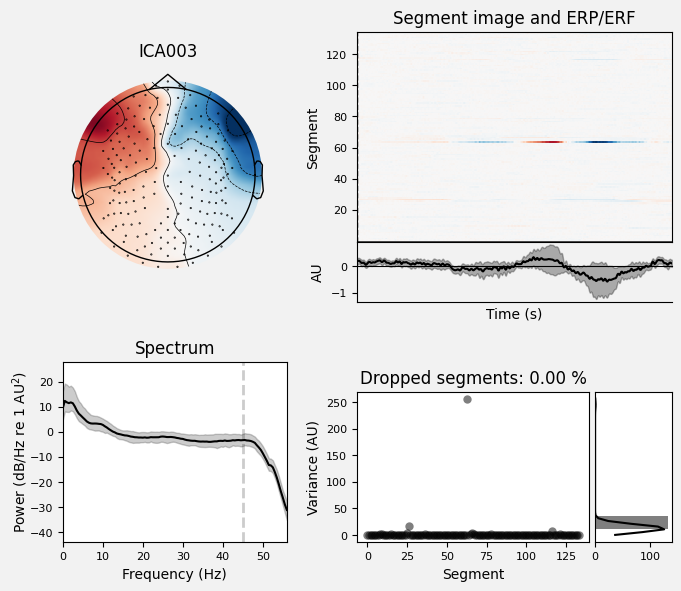

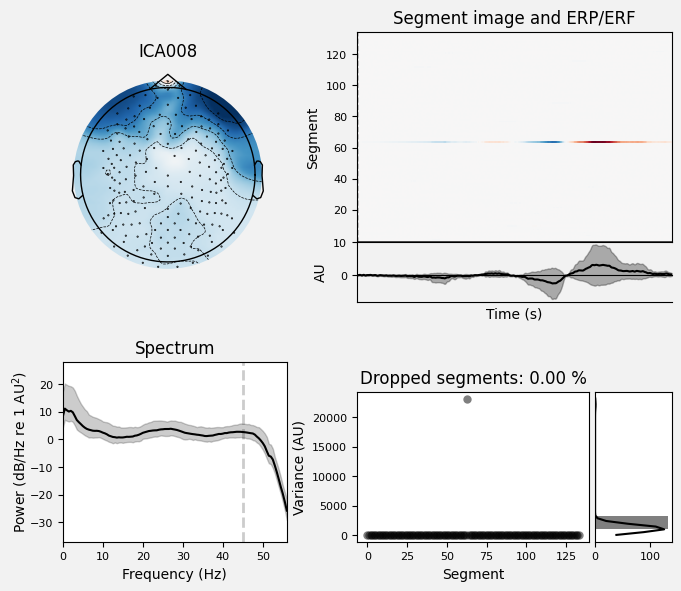

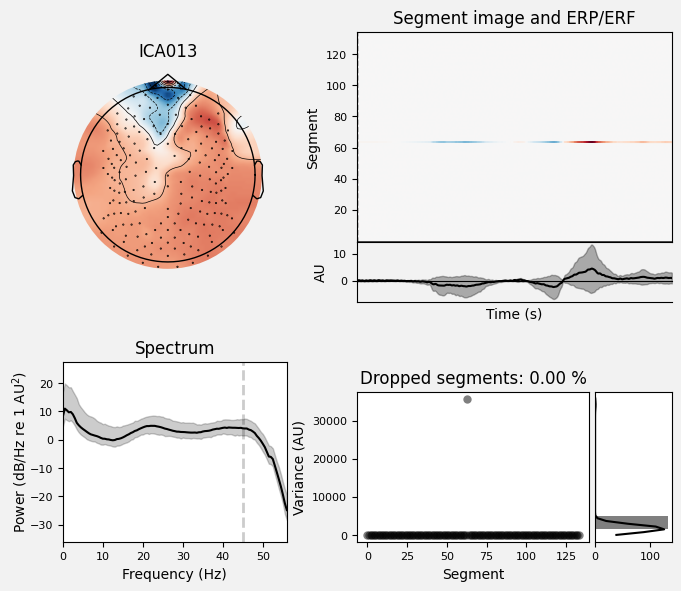

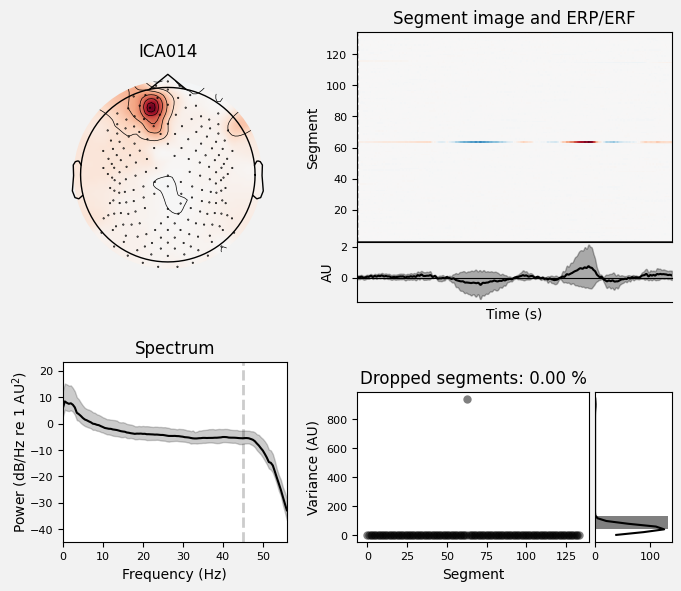

...

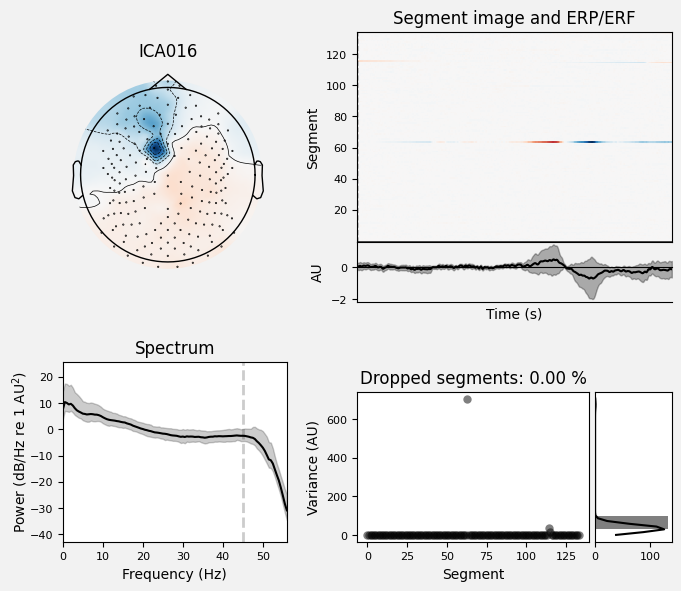

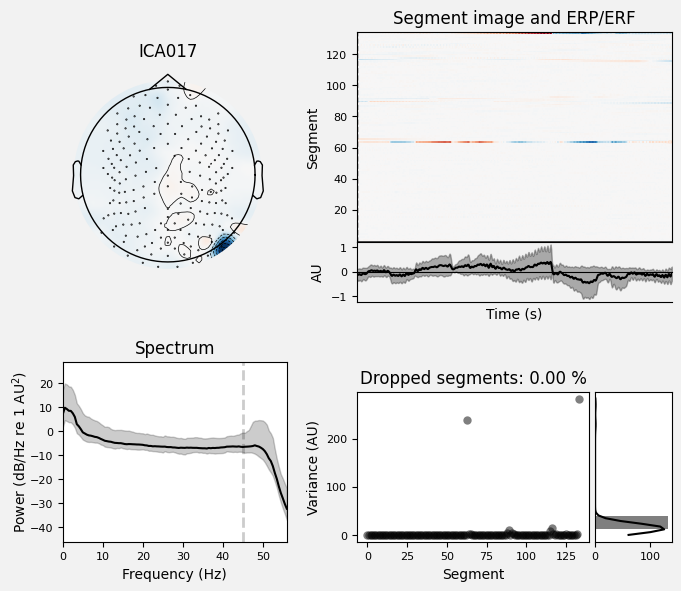

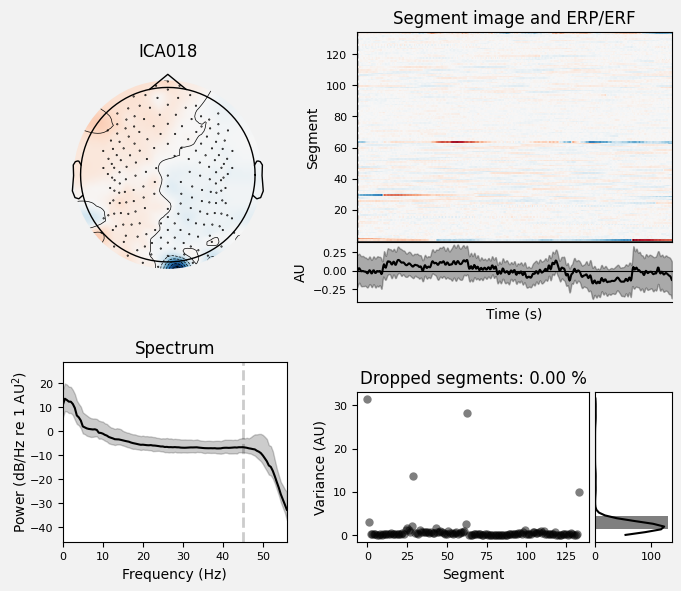

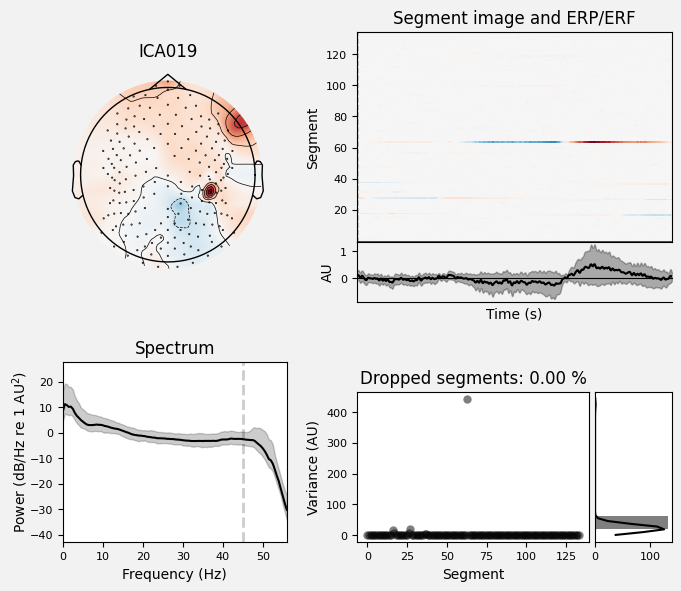

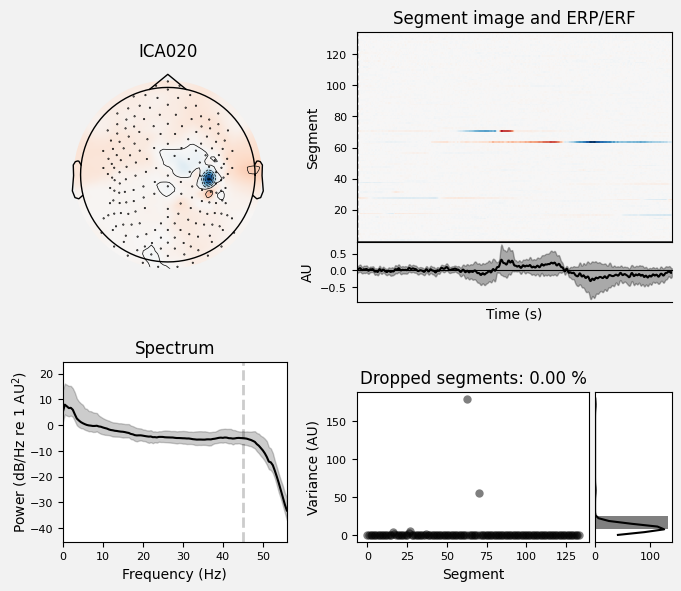

[<MNEFigure size 975x967 with 20 Axes>, <MNEFigure size 195x260.5 with 1 Axes>]

In [67]:
import numpy as np
from mne_icalabel import label_components

# 1. Perform ICLabel classification
# We use 'np.errstate' to temporarily ignore the math warnings inside ICLabel
print("Classifying ICA components...")
with np.errstate(divide='ignore', invalid='ignore'):
    ic_labels = label_components(clean_raw, ica, method="iclabel")

# 2. Define the artifact types we want to visualize/exclude
artifacts = ["eye blink", "muscle artifact", "heart beat", "line noise", "channel noise"]

# 3. Call your custom plotting function
# This will now use the labels generated above
figs = plot_ica_by_label(ica, clean_raw, ic_labels)

# 4. Optional: Mark these components as 'bad' in the ICA object
bad_indices = [i for i, l in enumerate(ic_labels["labels"]) if l in artifacts]
ica.exclude = bad_indices
print(f"ICA components excluded: {ica.exclude}")

# Extract probabilities and labels
probs = ic_labels["y_pred_proba"]
labels = ic_labels["labels"]

# Only exclude if the label is in our artifact list AND probability > 0.90
ica.exclude = [
    i for i, label in enumerate(labels) 
    if label in artifacts and probs[i] > 0.90
]

print(f"Components marked for exclusion (>90% confidence): {ica.exclude}")
if not ica.exclude:
    print("No components met the 90% confidence threshold for exclusion.")

# 3. Call the plotting function
# This will still plot all components, but your ica.exclude is now set for processing
plot_ica_by_label(ica, clean_raw, ic_labels, report=report)

In [68]:
# Run this before label_components to check for issues
locs = np.array([ch['loc'][:3] for ch in clean_raw.info['chs']])
unique_locs = np.unique(locs, axis=0)

if len(locs) != len(unique_locs):
    print(f"⚠️ Warning: Found {len(locs) - len(unique_locs)} duplicate channel locations.")

In [69]:
import pandas as pd
import os

# Define the central log path
log_path = f"{paths.outputs}/ica_cleaning_master_log.csv"

def get_exclusion_list(subject_id, ic_labels, log_path):
    # 1. Default: Use ICLabel with 90% threshold
    probs = ic_labels["y_pred_proba"]
    labels = ic_labels["labels"]
    artifacts = ["eye blink", "muscle artifact", "heart beat", "line noise", "channel noise"]
    
    auto_exclude = [
        i for i, label in enumerate(labels) 
        if label in artifacts and probs[i] > 0.90
    ]

    # 2. Check if CSV exists and has a manual override for this subject
    if os.path.exists(log_path):
        df_log = pd.read_csv(log_path)
        # Convert subject_id to string to match CSV
        sub_row = df_log[df_log['subject_id'].astype(str) == str(subject_id)]
        
        if not sub_row.empty:
            # If manual_exclude column is not empty, use it
            manual = sub_row.iloc[0]['manual_exclude']
            if pd.notna(manual):
                # Expecting string like "0, 2, 5" in CSV
                print(f"✅ Using manual override from CSV for sub-{subject_id}")
                return [int(x.strip()) for x in str(manual).split(',') if x.strip().isdigit()]

    # 3. Specific hardcoded rule for Subject 170
    if str(subject_id) == "170":
        return [0]

    return auto_exclude

# --- EXECUTION ---

# A. Perform ICLabel
# A. Perform ICLabel (Wrapped to ignore the FloatingPointError)
print("Classifying ICA components...")
with np.errstate(divide='ignore', invalid='ignore'):
    ic_labels = label_components(clean_raw, ica, method="iclabel")

# B. Determine final exclusion list
final_exclude = get_exclusion_list(subject_id, ic_labels, log_path)
ica.exclude = final_exclude

# C. Apply and Save
epochs_clean = ica.apply(epochs_good.copy(), exclude=ica.exclude)
epochs_clean.save(f"{paths.analysis}/sub-{subject_id}_clean_ica-manual-epo.fif", overwrite=True)

# D. Update the Master CSV Log
new_entry = {
    "subject_id": str(subject_id), # Force current ID to string
    "auto_detected": ",".join(map(str, final_exclude)),
    "manual_exclude": "", 
    "bad_channels": ",".join(clean_raw.info["bads"]),
    "status": "Auto-Cleaned"
}

if not os.path.exists(log_path):
    df_log = pd.DataFrame([new_entry])
else:
    df_log = pd.read_csv(log_path)
    
    # FIX: Convert existing subject_id column to strings to prevent mixed-type errors
    df_log['subject_id'] = df_log['subject_id'].astype(str)
    
    # Update existing subject or append new
    df_log = df_log[df_log['subject_id'] != str(subject_id)] # Remove old entry
    df_log = pd.concat([df_log, pd.DataFrame([new_entry])], ignore_index=True)

# Now sort_values will work because all IDs are strings
df_log.sort_values("subject_id").to_csv(log_path, index=False)
print(f"📝 Master log updated at: {log_path}")

Classifying ICA components...


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_24546/3497767169.py:44: RuntimeWarning: The provided Raw instance does not seem to be referenced to a common average reference (CAR). ICLabel was designed to classify features extracted from an EEG dataset referenced to a CAR (see the 'set_eeg_reference()' method for Raw and Epochs instances).
  ic_labels = label_components(clean_raw, ica, method="iclabel")
/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_24546/3497767169.py:44: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(clean_raw, ica, method="iclabel")


Applying ICA to Epochs instance
    Transforming to ICA space (21 components)
    Zeroing out 1 ICA component
    Projecting back using 197 PCA components
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.
📝 Master log updated at: /Users/daniel/PhD/Projects/psd-paths/outputs/ica_cleaning_master_log.csv


Applying ICA to Evoked instance
    Transforming to ICA space (21 components)
    Zeroing out 1 ICA component
    Projecting back using 197 PCA components
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
78 matching events found
No baseline correction applied
0 projection items activated


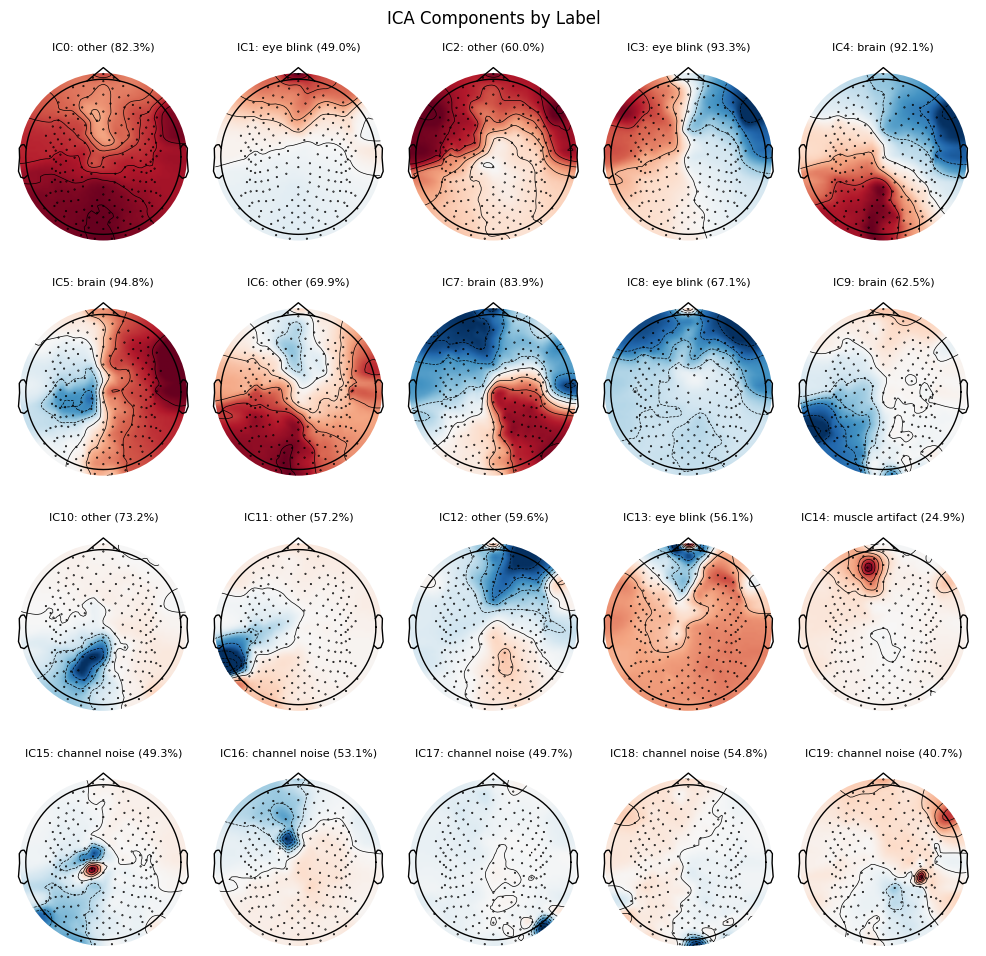

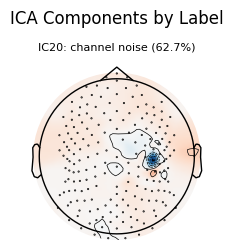

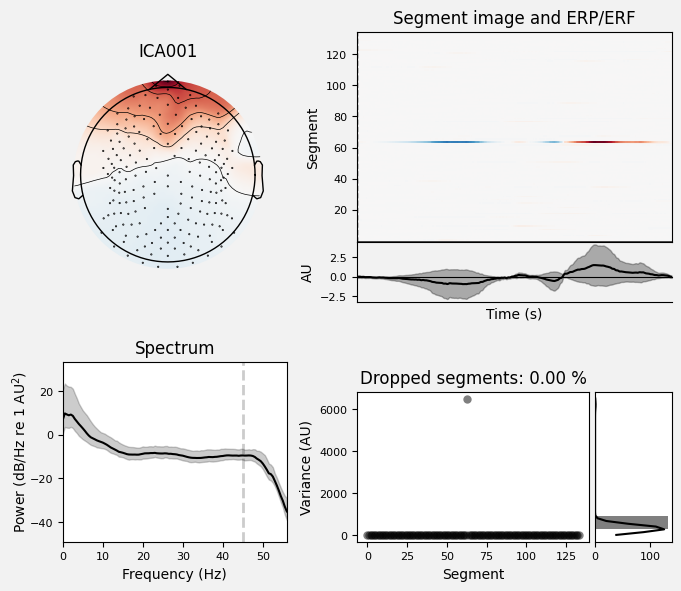

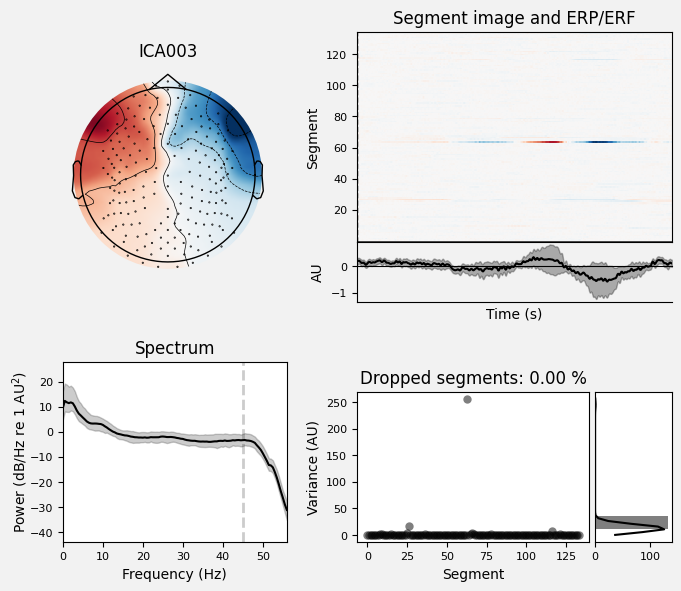

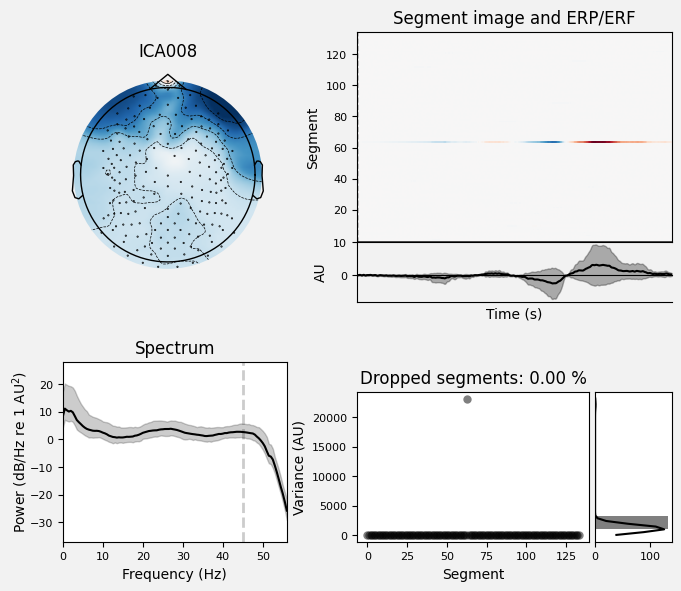

...

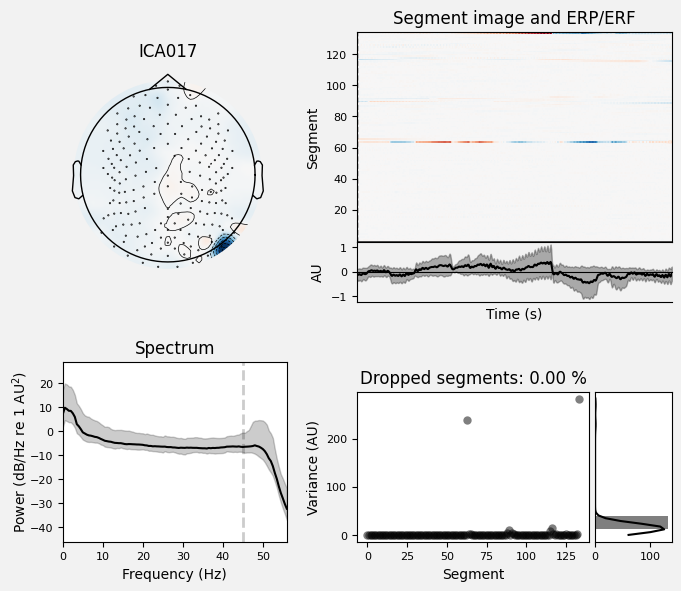

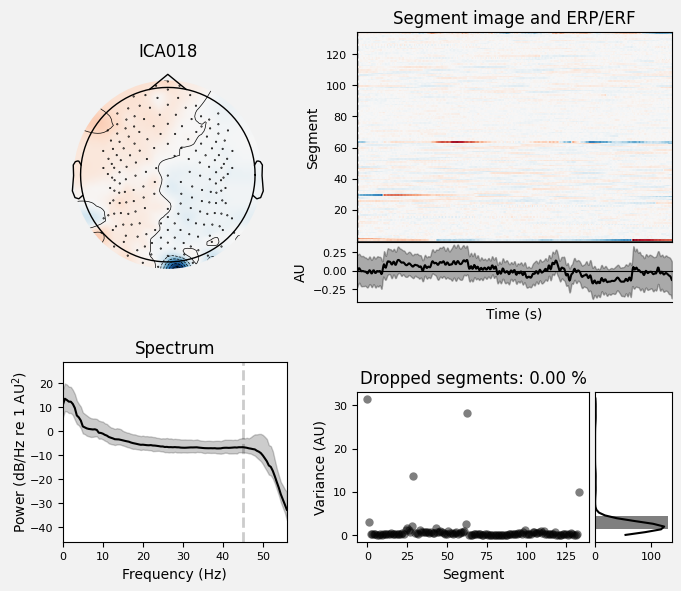

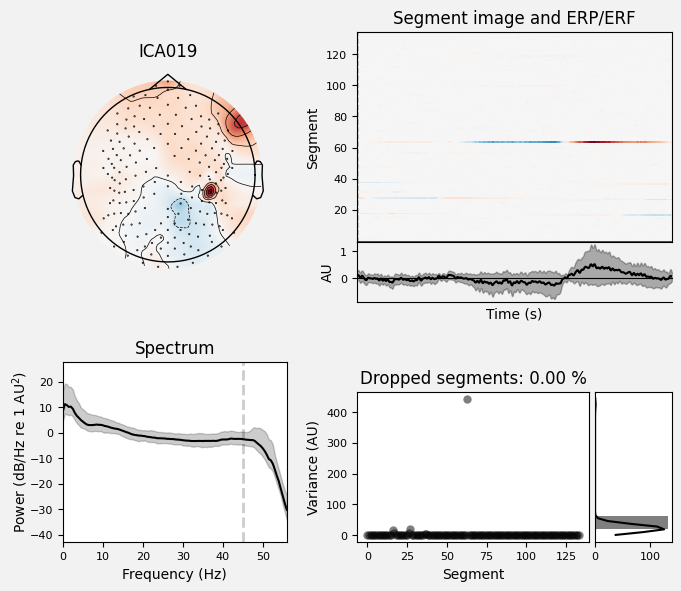

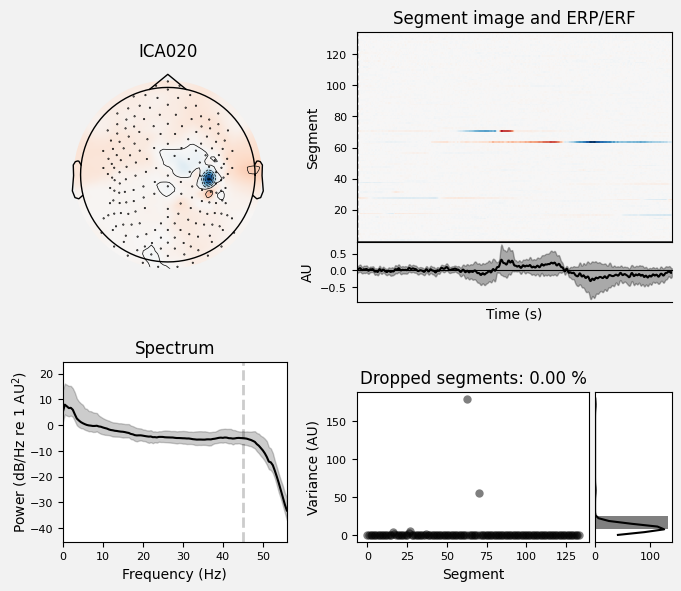

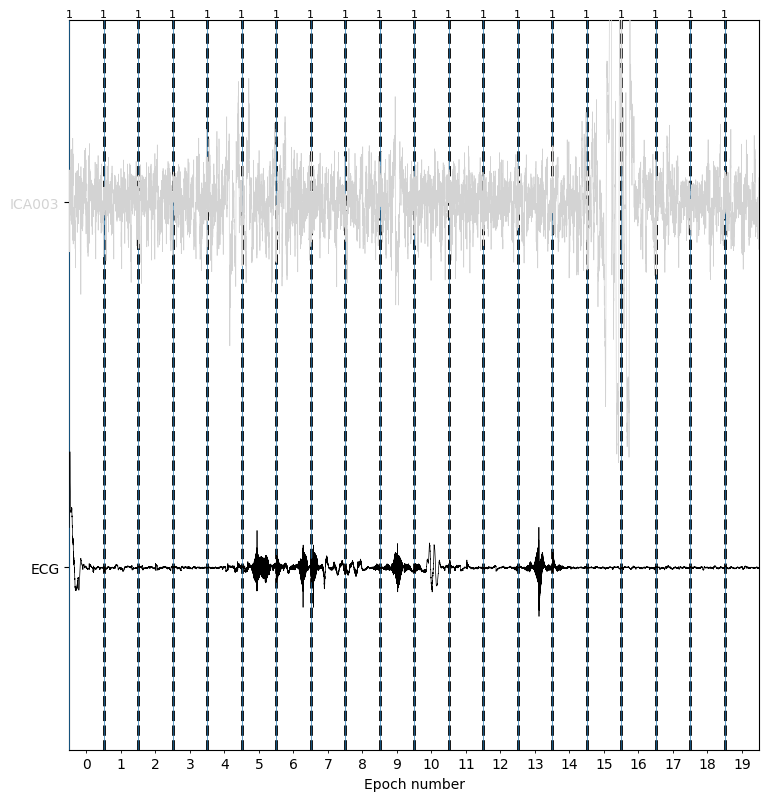

In [70]:
# Add location of bad channels
try:
    report.add_ica(
        ica=ica,
        title="ICA cleaning",
        picks=ica.exclude,  # plot the excluded EOG components
        inst=epochs_good,
    )
    # Add just sources of the removed components
    ica_figure_sources = ica.plot_sources(
        epochs_good, picks=final_exclude, show_scrollbars=False
    )
    report.add_figure(ica_figure_sources, title="ICA rejected components")

except Exception as e:
    # If an exception occurs, print the error message
    print("An error occurred:", e)

# ICA plot overlay

Applying ICA to Evoked instance
    Transforming to ICA space (21 components)
    Zeroing out 1 ICA component
    Projecting back using 197 PCA components


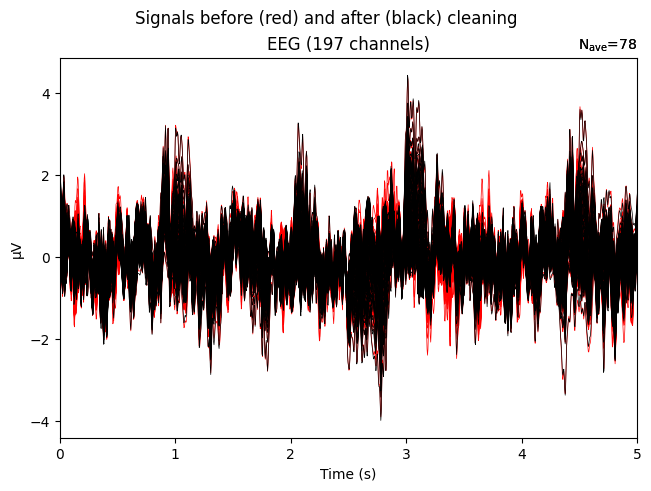

In [71]:
cleaned_plot = ica.plot_overlay(epochs_good.average())

No projector specified for this dataset. Please consider the method self.add_proj.


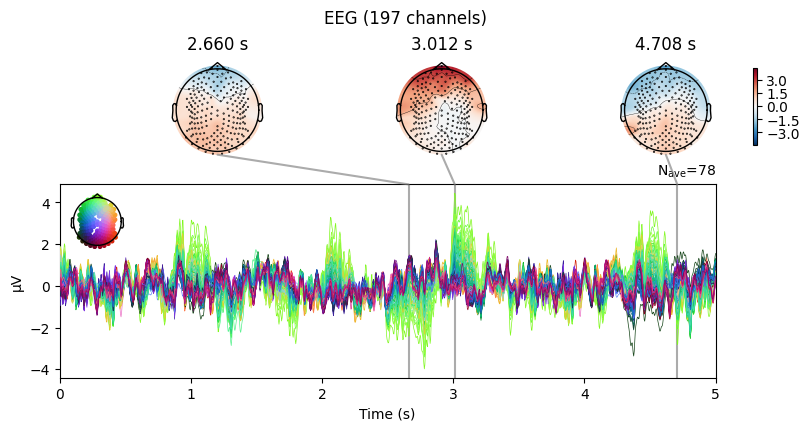

Effective window size : 5.004 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


In [72]:
epochs_plot, epochs_timeseries, epochs_plot_psd = plot_epochs(
epochs_clean, figures_path=figures_path, subject=subject_id
)
report.add_figure(epochs_plot, title="Cleaned epochs after ICA")
report.add_figure(epochs_plot_psd, title="Cleaned epochs after ICA - PSD")

In [73]:
ica.save(
    f"{paths.analysis}/sub-{subject_id}_my_ica_model-ica.fif", overwrite=True)

Overwriting existing file.
Writing ICA solution to /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/sub-101_my_ica_model-ica.fif...
Overwriting existing file.


Method,infomax
Fit parameters,extended=Truemax_iter=500
Fit,500 iterations on epochs (97578 samples)
ICA components,21
Available PCA components,197
Channel types,eeg
ICA components marked for exclusion,ICA003


# Final part of the analysis

In [74]:
ica_loaded = mne.preprocessing.read_ica(
    f"{paths.analysis}/sub-{subject_id}_my_ica_model-ica.fif"
)

Reading /Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/sub-101_my_ica_model-ica.fif ...
Now restoring ICA solution ...
Ready.


fitting finished


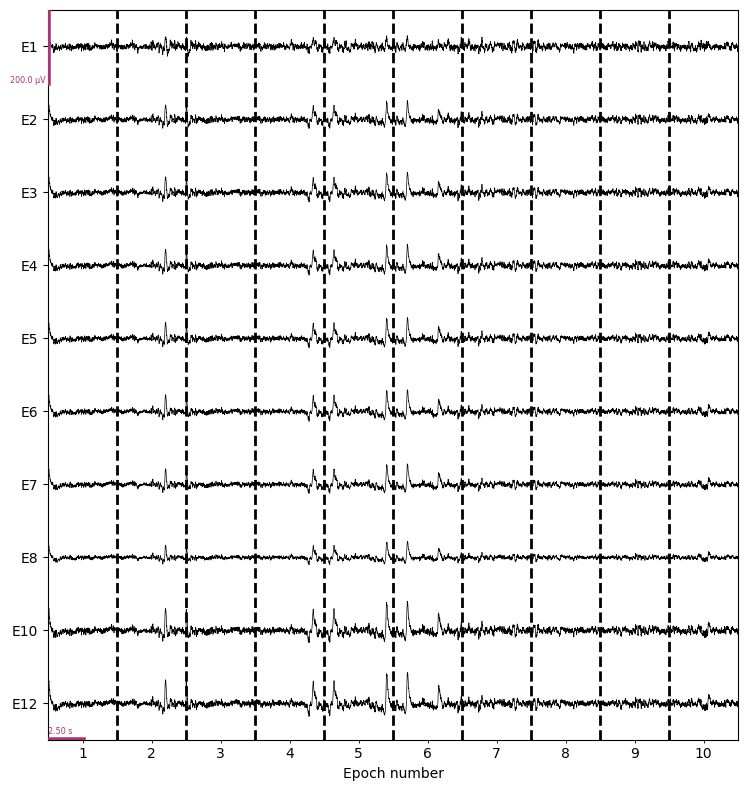

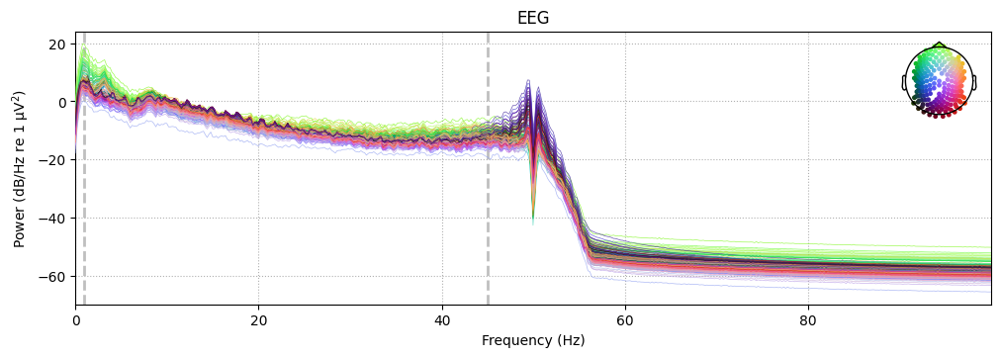

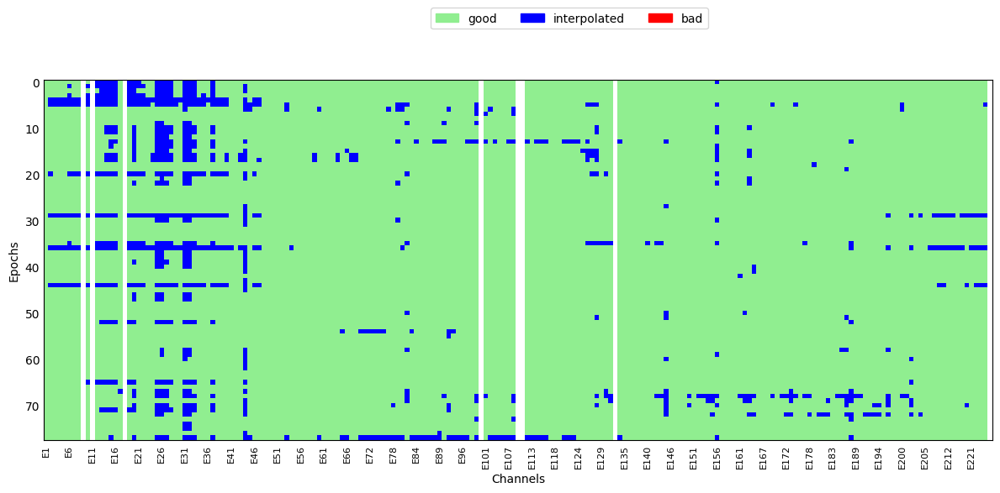

In [75]:
auto_reject_pre_ica = autoreject.AutoReject(
    n_interpolate=[1, 2, 4, 8, 32, 64],
    n_jobs=-1,
    random_state=100,
    thresh_method="bayesian_optimization",
    verbose=False,
    # n_interpolate=np.array([0]),
    # consensus=0.8,
).fit(epochs_clean)
print("fitting finished")
epochs_ar, reject_log = auto_reject_pre_ica.transform(
   epochs_clean, return_log=True
)


# depending of the resampling - different number of epochs are rejected

reject_plot = reject_log.plot("vertical")
report.add_figure(
    reject_plot, title="Interpolated epochs - AutoReject overview")

# Add the last part to the report
report.add_figure(
    reject_plot, title="Autoreject - Rejected and interpolated epochs after ICA"
)

In [76]:
epochs_interpolated = epochs_ar.copy().interpolate_bads(exclude=["VREF"])
epochs_interpolated.save(
    f"{paths.analysis}/sub-{subject_id}_interpolated-epo.fif", overwrite=True
)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.9 mm
Computing interpolation matrix from 197 sensor positions
Interpolating 7 sensors
Overwriting existing file.
Overwriting existing file.
Overwriting existing file.


[PosixPath('/Users/daniel/PhD/Projects/psd-paths/data/derrivatives/sub-101/analysis/sub-101_interpolated-epo.fif')]

No projector specified for this dataset. Please consider the method self.add_proj.


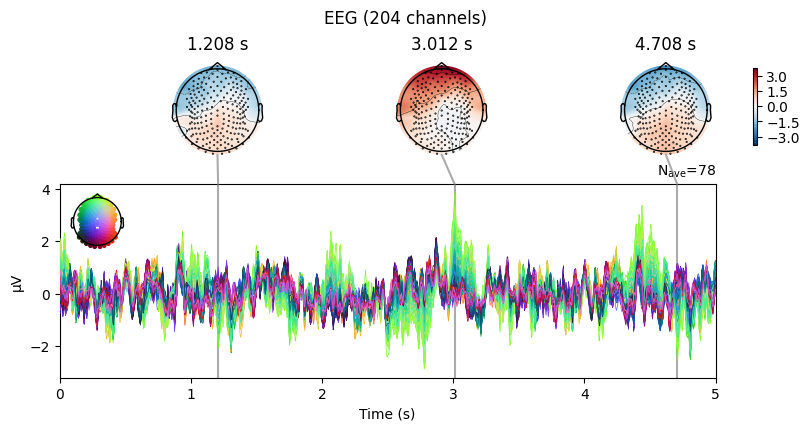

Effective window size : 5.004 (s)
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


In [77]:
# epochs_interpolated
epochs_plot, epochs_timeseries, epochs_plot_psd = plot_epochs(
    epochs_interpolated, figures_path, subject_id, stage="final_interpolared_epochs"
)
# Add figures to the report
report.add_figure(epochs_plot, title="Interpolated epochs")
report.add_figure(epochs_plot_psd, title="Interpolated epochs - PSD")

In [78]:
from specparam.plts.spectra import plot_spectra
from specparam import SpectralGroupModel


fg = SpectralGroupModel(
    peak_width_limits=[1, 6],
    min_peak_height=0.15,
    peak_threshold=2.0,
    max_n_peaks=6,
    verbose=False,
)

In [79]:
psd = epochs_interpolated.compute_psd().average()
spectra, freqs = psd.get_data(return_freqs=True)
# Initialize a FOOOFGroup object, with desired settings

# Define the frequency range to fit
freq_range = [2, 40]
with np.errstate(divide='ignore', invalid='ignore', over='ignore'):
    fg.fit(freqs, spectra, freq_range)
fg.plot()

    Using multitaper spectrum estimation with 7 DPSS windows


/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/specparam/modes/funcs.py:33: RuntimeWarning: underflow encountered in exp
  ys = ys + hgt * np.exp(-(xs-ctr)**2 / (2*wid**2))
/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/specparam/modes/funcs.py:33: RuntimeWarning: underflow encountered in multiply
  ys = ys + hgt * np.exp(-(xs-ctr)**2 / (2*wid**2))
/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/specparam/modes/jacobians.py:43: RuntimeWarning: underflow encountered in exp
  exp = np.exp(-ax2 / (2 * c2))
/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/specparam/modes/jacobians.py:44: RuntimeWarning: underflow encountered in multiply
  exp_b = exp * b
/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/specparam/modes/jacobians.py:47: RuntimeWarning: underflow encountered in multiply
  jacobian[:, ii] = (exp_b * ax) / c2
/Users/daniel/PhD/Projects/psd-paths/.venv/lib/pyth

In [80]:
channel_names = epochs_interpolated.info["ch_names"]
df_channels = pd.DataFrame({"ID": range(len(channel_names)), "ch": channel_names})

df = specparam2pandas(fg)
df = df.merge(df_channels, on="ID")
df["sub_id"] = subject_id


# Get the current date and time
now = datetime.now()
df["timestamp"] = now
df["nr_intepolated_channels"] = len(epochs_ar.info["bads"])
df["nr_dropped_ica"] = len(ica.exclude)
df["nr_retained_ica"] = ica.n_components_ - len(ica.exclude)
# Create a new list of column names
cols = ["ch"] + [col for col in df.columns if col != "ch"]

# Reorder the columns
df = df[cols]

# Plot R and exponent across the scalp

In [81]:
fg.to_df(None)

,offset,exponent,error_mae,gof_rsquared
0,-8.165029,1.575800,0.031375,0.993124
1,-8.206820,1.600473,0.034609,0.992337
2,-8.288334,1.545694,0.031147,0.994504
3,-8.300082,1.552104,0.039438,0.991557
4,-8.274281,1.604984,0.044086,0.988889
...,...,...,...,...
199,-8.241354,1.605523,0.026233,0.995519
200,-8.262080,1.637526,0.025700,0.995684
201,-8.314118,1.625903,0.026905,0.995318
202,-8.317778,1.626545,0.028044,0.995080


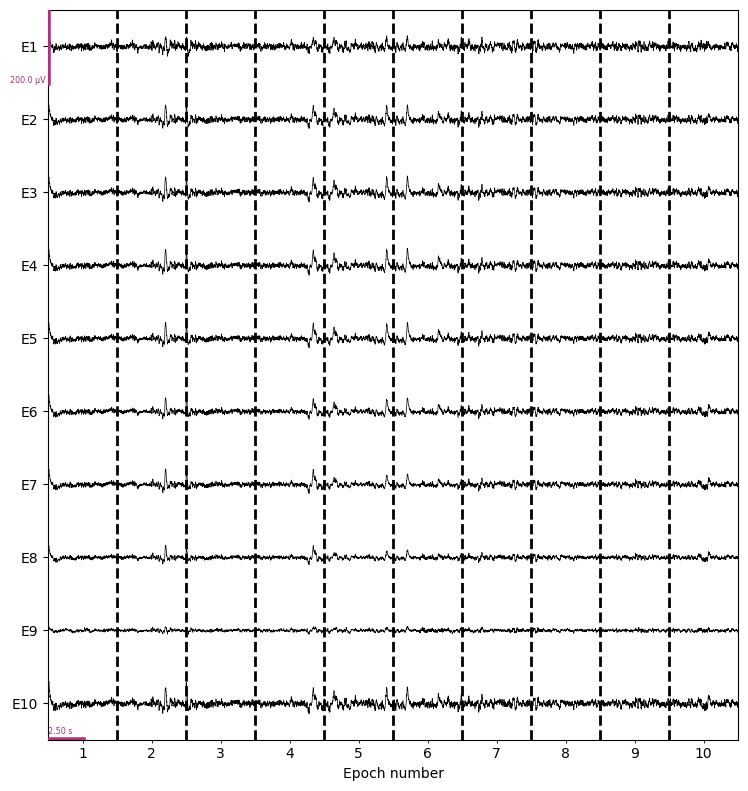

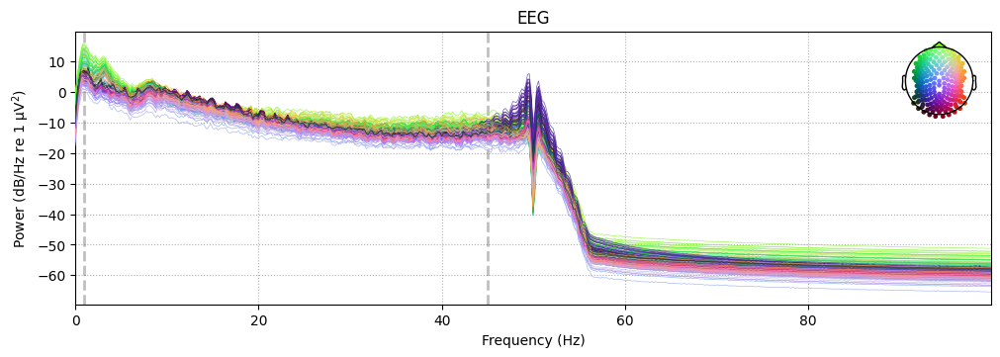

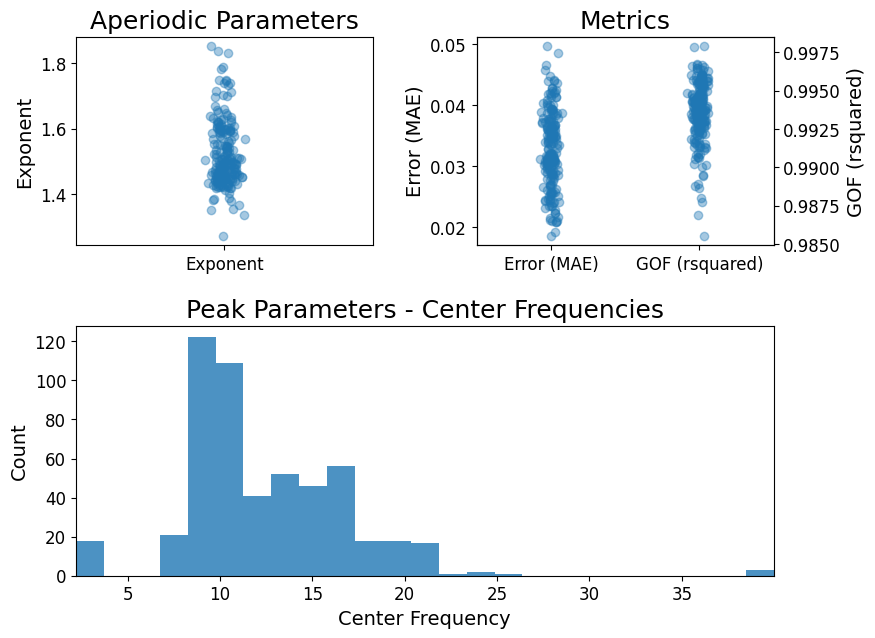

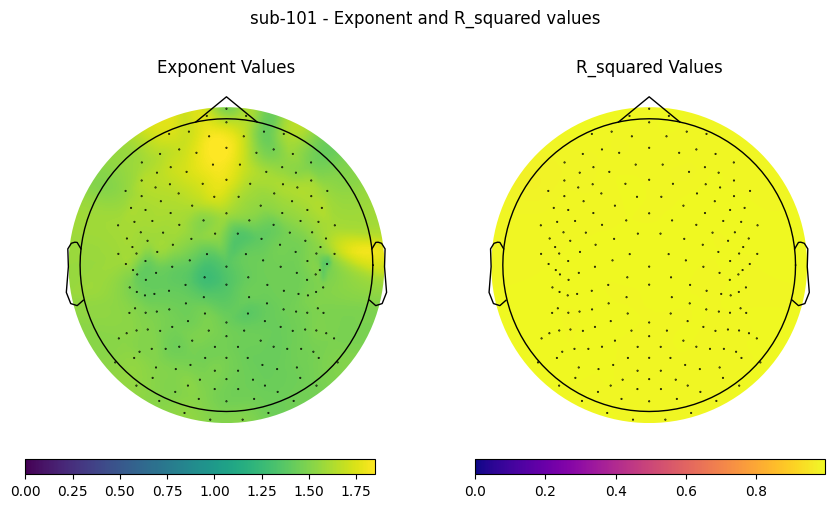

In [82]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import mne  # Make sure you have the MNE library installe

# Extract aperiodic exponent values
# Extract aperiodic exponent values (Updated)
# For the exponent (aperiodic parameters)
results_df = fg.to_df()

# 2. Extract the values directly from the DataFrame columns
# In 2.0rc6, these columns are named 'exponent' and 'r2'
exps = results_df['exponent'].values
r_squared = results_df['gof_rsquared'].values
# Assuming 'exps' is your data array and 'raw' is an MNE raw object
# Also, assuming 'unit_label' and 'fontsize' variables are defined

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# The 'cmap' parameter expects a colormap object, not a string
im1, _ = mne.viz.plot_topomap(
    exps, epochs_interpolated.info, axes=axs[0], cmap="viridis", contours=0, show=False
)
axs[0].set_title("Exponent Values")

#  Colorbar setup for the first subplot at the bottom
cbar_ax1 = fig.add_axes([0.1, 0.05, 0.35, 0.03])
fig.colorbar(im1, cax=cbar_ax1, orientation="horizontal")


# Plot the 'errors' data in the second subplot
im2, _ = mne.viz.plot_topomap(
    r_squared,
    epochs_interpolated.info,
    axes=axs[1],
    cmap="plasma",
    contours=0,
    show=False,
)
axs[1].set_title("R_squared Values")

# Colorbar setup for the second subplot at the bottom
cbar_ax2 = fig.add_axes([0.55, 0.05, 0.35, 0.03])
fig.colorbar(im2, cax=cbar_ax2, orientation="horizontal")
fig.suptitle(f"sub-{subject_id} - Exponent and R_squared values")

plt.show()
report.add_figure(fig, title="Exponent and R_squared values")

In [83]:
# Compare the power spectra between low and high exponent channels
fig, ax = plt.subplots(1, 2, figsize=(12, 6))


def argmedian(arr):
    return np.argsort(arr)[len(arr) // 2]


# Updated attribute: .power_spectrum -> .spectrum
spectra_exp = [
    fg.get_model(np.argmin(exps)).data.power_spectrum,
    fg.get_model(argmedian(exps)).data.power_spectrum,
    fg.get_model(np.argmax(exps)).data.power_spectrum,
]


labels_spectra_exp = [
    f"Low Exponent {format(np.min(exps), '.2f')}",
    f"Median Exponent {format(np.median(exps), '.2f')}",
    f"High Exponent {format(np.max(exps), '.2f')}",
]

plot_spectra(
    fg.data.freqs,
    spectra_exp,
    ax=ax[0],
    labels=labels_spectra_exp,
)
# Do the same for the R-squared spectra
spectra_r_squared = [
    fg.get_model(np.argmin(r_squared)).data.power_spectrum,
    fg.get_model(argmedian(r_squared)).data.power_spectrum,
    fg.get_model(np.argmax(r_squared)).data.power_spectrum,
]

labels_spectra_r_squared = [
    f"Low R_squared  {format(np.min(r_squared), '.2f')}",
    f"Median R_squared {format(np.median(r_squared), '.2f')}",
    f"High R_squared {format(np.max(r_squared), '.2f')}",
]


my_colors = ["blue", "green", "red"]
plot_spectra(
    fg.data.freqs,
    spectra_r_squared,
    ax=ax[1],
    labels=labels_spectra_r_squared,
    colors=my_colors,
)
ylim1 = ax[0].get_ylim()
ylim2 = ax[1].get_ylim()
# Set the same limits on the y-axis for both plots
ax[0].set_ylim(min(ylim1[0], ylim2[0]), max(ylim1[1], ylim2[1]))
ax[1].set_ylim(min(ylim1[0], ylim2[0]), max(ylim1[1], ylim2[1]))
fig.suptitle(
    f"sub-{subject_id} - Power spectra comparison between low, median and high exponent and R_squared values"
)

report.add_figure(
    fig, title="Examples of spectra as a function of exponent and R_squared values"
)

/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/specparam/modes/funcs.py:33: RuntimeWarning: underflow encountered in exp
  ys = ys + hgt * np.exp(-(xs-ctr)**2 / (2*wid**2))
/Users/daniel/PhD/Projects/psd-paths/.venv/lib/python3.13/site-packages/specparam/modes/funcs.py:33: RuntimeWarning: underflow encountered in multiply
  ys = ys + hgt * np.exp(-(xs-ctr)**2 / (2*wid**2))


In [84]:
spectra_exp_fm = [
    fg.get_model(np.argmin(exps), regenerate=True),
    fg.get_model(argmedian(exps), regenerate=True),
    fg.get_model(np.argmax(exps), regenerate=True),
]
for fm, label in zip(spectra_exp_fm, labels_spectra_exp):
    # fm = fg.get_fooof(ind=2, regenerate=True)
    # Print results and plot extracted model fit
    fm.print_results()
    fm.plot()
    print(label)

                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was fit with the 'spectral_fit' algorithm                        
               Model was fit to the 2-40 Hz frequency range with 0.20 Hz resolution               
                                                                                                  
                               Aperiodic Parameters ('fixed' mode)                                
                                        (offset, exponent)                                        
                                         -9.0951, 1.2721                                          
                                                                                                  
          

In [85]:
spectra_r_squared_fm = [
    fg.get_model(np.argmin(r_squared), regenerate=True),
    fg.get_model(argmedian(r_squared), regenerate=True),
    fg.get_model(np.argmax(r_squared), regenerate=True),
]

for fm, label in zip(spectra_r_squared_fm, labels_spectra_r_squared):
    # fm = fg.get_fooof(ind=2, regenerate=True)
    # Print results and plot extracted model fit
    fm.print_results()
    fm.plot()
    print(label)

                                                                                                  
                                       POWER SPECTRUM MODEL                                       
                                                                                                  
                       The model was fit with the 'spectral_fit' algorithm                        
               Model was fit to the 2-40 Hz frequency range with 0.20 Hz resolution               
                                                                                                  
                               Aperiodic Parameters ('fixed' mode)                                
                                        (offset, exponent)                                        
                                         -8.2526, 1.5650                                          
                                                                                                  
          

In [86]:
df.to_csv(f"{paths.specparam}/sub-{subject_id}-specparam.csv", index=False)
print(f"Subject {subject_id} done")

Subject 101 done


In [87]:
report.save(
    f"{paths.reports}/sub-{subject_id}_report_manual.html", overwrite=True
)

Overwriting existing file.
Saving report to : /Users/daniel/PhD/Projects/psd-paths/outputs/reports/sub-101/sub-101_report_manual.html


'/Users/daniel/PhD/Projects/psd-paths/outputs/reports/sub-101/sub-101_report_manual.html'